In [1]:
import tensorflow as tf
import pandas as pd
import numpy as np
import math
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import SimpleRNN
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import itertools
import random as python_random
from keras.initializers import GlorotUniform
from keras.initializers import Orthogonal
from keras.initializers import HeNormal
from keras.initializers import HeUniform


np.random.seed(42)
tf.random.set_seed(42)
python_random.seed(42)

2024-06-13 23:29:07.575070: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-06-13 23:29:07.595505: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-13 23:29:07.595545: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-13 23:29:07.596096: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-13 23:29:07.599739: I tensorflow/core/platform/cpu_feature_guar

In [2]:
def load_data(filepath):
    return pd.read_csv(filepath, parse_dates=['Date'])

In [3]:
def create_sequences(data, target, n_steps):
    X, y = [], []
    # print("data", data[:15])
    # print("target", target[:15])
    for i in range(len(data) - n_steps):
        X.append(data[i:(i + n_steps)])
        y.append(target[i + n_steps])
    return np.array(X), np.array(y)

In [4]:
def modify_data(data):
    result = None
    # print(data)

    # copy LMCADY_acu_5d_log into a new column ACU_5D and shift it by 5 days
    data['ACU_5D'] = data['LMCADY_acu_5d_log']
    data['ACU_5D'] = data['ACU_5D'].shift(5)

    data['ACU_4D'] = data['LMCADY'].rolling(window=4).sum()
    data['ACU_3D'] = data['LMCADY'].rolling(window=3).sum()
    data['ACU_2D'] = data['LMCADY'].rolling(window=2).sum()

    data.dropna(inplace=True)
    data.reset_index(drop=True, inplace=True)

    result = data
    # print(result.head(10))
    return result

In [5]:
def prepare_data(df, target_column, n_steps, feature_list = []):

    df = modify_data(df)
    df.to_csv('../output/modified_data.csv', index=False)

    features = df.drop(columns=[target_column, 'LMCADY_std_5d_log'])
    features = features.drop(columns = ['Date'])
    features = features[feature_list]
    print("Features utilizados:",features.columns)

    target = df[target_column]

    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(features)
    X, y = create_sequences(features_scaled, target, n_steps)
    # for i in range(15):
    #     print(X[i][0][0], y[i])
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.05, shuffle = False)

    return X_train, X_test, y_train, y_test

In [6]:
def rmse(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_true - y_pred)))

In [7]:
def build_model(input_shape, md_prm: dict):
    model = Sequential()
    initializer = md_prm['initializer']
    
    model.add(SimpleRNN(md_prm['lstm_units1'], input_shape=input_shape, kernel_initializer=initializer))
    model.add(Dense(1, kernel_initializer=initializer))
    model.compile(optimizer=Adam(learning_rate=0.0005), loss='mean_squared_error', metrics=[rmse])
    
    return model

In [8]:
def train_model(model, X_train, y_train, epochs, batch_size, verbose):

    early_stopping = EarlyStopping(
        monitor             ='val_loss',
        patience            =25,
        verbose             =1,
        restore_best_weights=True
    )

    history = model.fit(
        X_train, y_train,
        epochs              =epochs,
        batch_size          =batch_size,
        verbose             =verbose,
        callbacks           =[early_stopping],
        validation_split    =0.05
    )

    return history

In [9]:
def evaluate_model(model, X_test, y_test):
    return model.evaluate(X_test, y_test)

In [10]:
def plot_predictions(y_true, y_pred, n=-1, title="Prediction vs Actual Data", markersize=3, rmse=None):
    if n != -1:
        n = min(n, len(y_true), len(y_pred))

        y_true = y_true[-n:]
        y_pred = y_pred[-n:]

    plt.figure(figsize=(18, 2.5))
    plt.plot(y_true, label='Actual Values', marker='o', linestyle='-', markersize=markersize)

    # Plot the RMSE lines if rmse is provided
    if rmse is not None:
        plt.axhline(y= rmse, color='green', linestyle='--', linewidth=0.7)
        plt.axhline(y=-rmse, color='green', linestyle='--', linewidth=0.7)

        tot_pred = 0
        prof = 0
        loss = 0

        # plot green markers beyond the rmse range
        for i in range(len(y_pred)):
            if (y_pred[i] > rmse or y_pred[i] < - rmse):
                # print("{} {}".format(y_pred[i],y_true[i]))
                if (y_true[i] > 0 and y_pred[i] > 0) or (y_true[i] < 0 and y_pred[i] < 0):
                    plt.plot(i, y_pred[i], 'gx', markersize=markersize+1)
                    prof += 1
                else:
                    plt.plot(i, y_pred[i], 'rx', markersize=markersize+1)
                    loss += 1
                tot_pred += 1
            else:
                plt.plot(i, y_pred[i], marker='x', color='orange', markersize=markersize-1)

    else:
        plt.plot(y_true, label='Actual Values'   , marker='o', linestyle='-' , markersize=markersize)
        plt.plot(y_pred, label='Predicted Values', marker='x', linestyle='--', markersize=markersize)

    plt.axhline(y=0, color='gray', linestyle='--', linewidth=0.7)

    plt.title(title)
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

    return tot_pred, prof, loss

In [11]:
def trend_accuracy(y_true, y_pred):
    trend_up_true = 0
    trend_down_true = 0
    trend_up_pred = 0
    trend_down_pred = 0

    for j in range(len(y_true)-1):
        if y_true[j] > 0.0:
            trend_up_pred += 1
            if y_pred[j] > 0.0:
                trend_up_true += 1
        if y_true[j] < 0.0:
            trend_down_pred += 1
            if y_pred[j] < 0.0:
                trend_down_true += 1

    trend_true = trend_up_true + trend_down_true
    trend_pred = trend_up_pred + trend_down_pred

    trend_up_accuracy = trend_up_true/trend_up_pred
    trend_down_accuracy = trend_down_true/trend_down_pred
    trend_accuracy = trend_true/trend_pred

    return trend_accuracy, trend_up_accuracy, trend_down_accuracy

In [12]:
n_steps_options     = [40,60]
batch_size_options  = [256]
epochs_options      = [200]

lstm_units_options1 = [25,75,100]
lstm_units_options2 = [25,75,100]
initializer         = [ 
                        # GlorotUniform(seed=42)
                        # HeNormal(seed=42), 
                        # HeUniform(seed=42), 
                        Orthogonal(seed=42)
                        ]
activation_options  = ['relu']
dropout_options     = [.15]
num_layers_options  = [2]

# variable_options = ['LMCADS03','LMCADY','SPX','MXWD','XAU','XAG','ACU_5D','ACU_4D','ACU_3D','ACU_2D']
# modified_lists = [variable_options[:i] + variable_options[i+1:] for i in range(len(variable_options))]
# print(modified_lists)
modified_lists = [['LMCADS03','LMCADY','SPX','MXWD','XAG','XAU','ACU_5D','ACU_4D','ACU_3D','ACU_2D']]

# combinations
model_params_combinations = list(itertools.product(
    n_steps_options     ,
    lstm_units_options1,
    lstm_units_options2,
    initializer        ,
    activation_options,
    dropout_options,
    num_layers_options,
    batch_size_options,
    epochs_options,
    modified_lists
))
target_column = 'LMCADY_acu_5d_log'

In [13]:
n_iterations = len(model_params_combinations)
print("Total iterations: {}".format(n_iterations))

Total iterations: 18


In [14]:
def run_model_iterations():
    top_results = []
    i = 1
    for params in model_params_combinations:
        n_steps, lstm_units1, lstm_units2, initializer, activation, dropout, num_layers, batch_size, epochs, var_options = params
        try:

            # data load
            df = load_data("../input/copper_log_returns_5d_final.csv")
            print("\nIteration {}/{}".format(i, n_iterations))
            # print("Params: n_steps: {}, lstm_units1: {}, lstm_units2: {}, activation: {}, dropout: {}, num_layers: {}".format(
            #     n_steps, lstm_units1, lstm_units2, activation, dropout, num_layers)
            # )

            print("Train : batch    > {}".format(batch_size))
            print("        epochs   > {}".format(epochs))
            print("        n_steps  > {}".format(n_steps))
            
            # data preparation
            # print("Variables used: {}".format(var_options))
            X_train, X_test, y_train, y_test = prepare_data(df, target_column, n_steps, var_options)

            # build model
            model_params = {
                'lstm_units1'   : lstm_units1,
                'lstm_units2'   : lstm_units2,
                'activation'    : activation,
                'dropout'       : dropout,
                'num_layers'    : num_layers,
                'initializer'   : initializer
            }
            print("Model params: \n{}".format(model_params))

            input_shape = (X_train.shape[1], X_train.shape[2])
            print("Input shape: {}".format(input_shape))
            model = build_model(input_shape, model_params)
            print(model.summary())

            # model train
            if True:
                history = train_model(model, X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=2)

                # model evaluation
                y_pred      = model.predict(X_test)
                rmse_score  = math.sqrt(mean_squared_error(y_test, y_pred))
                std_dev     = np.std(y_test)

                print("Pred std dev: {:.6f}, test std dev: {:.6f}".format(np.std(y_pred), std_dev))

                if rmse_score < std_dev:
                    diff = rmse_score - std_dev + abs(np.std(y_pred) - std_dev)/4.0
                else:
                    diff = (rmse_score - std_dev) + abs(np.std(y_pred) - std_dev)/2.0

                # diff = (rmse_score - std_dev) + abs(np.std(y_pred) - std_dev)/2.0
                tren_acc, trend_up, trend_down = trend_accuracy(y_test, y_pred)
                result = {
                    'md_prm'    : model_params,
                    'n_steps'   : n_steps,
                    'batch_size': batch_size,
                    'epochs'    : epochs,
                    'rmse'      : rmse_score,
                    'std_dev'   : std_dev,
                    'diff'      : diff,
                    'predictions': y_pred,
                    'true_values': y_test,
                    'feature_list': var_options,
                    'tr_ac': tren_acc,
                    'tr_up': trend_up,
                    'tr_down': trend_down
                }

                # print("RMSE: {:.6f}, STD_DEV: {:.6f}, DIFF: {:.6f}".format(rmse_score, std_dev, diff))
                print("RMSE: {:.6f}, STD_DEV: {:.6f}, STD_PRD: {:.6f}, OBJDIFF: {:.6f}, RDIFF: {:.6f}".format(rmse_score, std_dev, np.std(y_pred), diff, (rmse_score - std_dev)))

                print("Trend: {:.2f}, Up: {:.2f}, Down: {:.2f}".format(tren_acc*100, trend_up*100, trend_down*100))

                top_results.append(result)
                top_results = sorted(top_results, key=lambda x: x['diff'])
                tot_pred, prof, loss = plot_predictions(result['true_values'], result['predictions'], -1, title="It. {}".format(i),rmse = rmse_score)
                print("Total TH Pred.: {}".format(tot_pred))
                if tot_pred != 0:
                    print("TH Pred. acc. : {:.2f}".format(prof*100.0/tot_pred))

            print("Completed Iteration {}/{}".format(i, n_iterations))
        except Exception as ex:
            print(f"An error occurred: {ex}. Skipping this combination.")
        i += 1
    return top_results


Iteration 1/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 40
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Input shape: (40, 10)
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn (SimpleRNN)      (None, 25)                900       
                                                                 
 dense (Dense)               (None, 1)                 26        
                                                                 
Total params: 926 (3.62 KB)
Trainable params: 926 (3.62 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________

2024-06-13 23:29:08.817000: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-06-13 23:29:08.835476: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-06-13 23:29:08.835663: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

None
Epoch 1/200


2024-06-13 23:29:11.151905: I external/local_xla/xla/service/service.cc:168] XLA service 0x704ccc0141e0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-06-13 23:29:11.151920: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3080, Compute Capability 8.6
2024-06-13 23:29:11.155131: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-06-13 23:29:11.382984: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8902
I0000 00:00:1718339351.429412 2524474 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


20/20 - 2s - loss: 0.1322 - rmse: 0.3597 - val_loss: 0.1348 - val_rmse: 0.3342 - 2s/epoch - 101ms/step
Epoch 2/200
20/20 - 0s - loss: 0.0663 - rmse: 0.2556 - val_loss: 0.0689 - val_rmse: 0.2335 - 147ms/epoch - 7ms/step
Epoch 3/200
20/20 - 0s - loss: 0.0394 - rmse: 0.1975 - val_loss: 0.0400 - val_rmse: 0.1779 - 151ms/epoch - 8ms/step
Epoch 4/200
20/20 - 0s - loss: 0.0276 - rmse: 0.1660 - val_loss: 0.0272 - val_rmse: 0.1497 - 150ms/epoch - 7ms/step
Epoch 5/200
20/20 - 0s - loss: 0.0218 - rmse: 0.1480 - val_loss: 0.0211 - val_rmse: 0.1350 - 147ms/epoch - 7ms/step
Epoch 6/200
20/20 - 0s - loss: 0.0183 - rmse: 0.1348 - val_loss: 0.0176 - val_rmse: 0.1260 - 172ms/epoch - 9ms/step
Epoch 7/200
20/20 - 0s - loss: 0.0158 - rmse: 0.1255 - val_loss: 0.0153 - val_rmse: 0.1192 - 168ms/epoch - 8ms/step
Epoch 8/200
20/20 - 0s - loss: 0.0140 - rmse: 0.1182 - val_loss: 0.0135 - val_rmse: 0.1146 - 150ms/epoch - 7ms/step
Epoch 9/200
20/20 - 0s - loss: 0.0124 - rmse: 0.1113 - val_loss: 0.0123 - val_rmse: 0

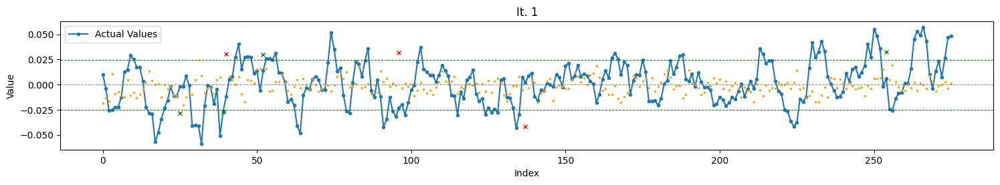

Total TH Pred.: 7
TH Pred. acc. : 57.14
Completed Iteration 1/18

Iteration 2/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 40
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 25, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Input shape: (40, 10)
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_1 (SimpleRNN)    (None, 25)                900       
                                                                 
 dense_1 (Dense)             (None, 1)                 26        
                                                                 
Total params: 926 (3.62 KB)
Trainable params: 926 (3.62 KB)
No

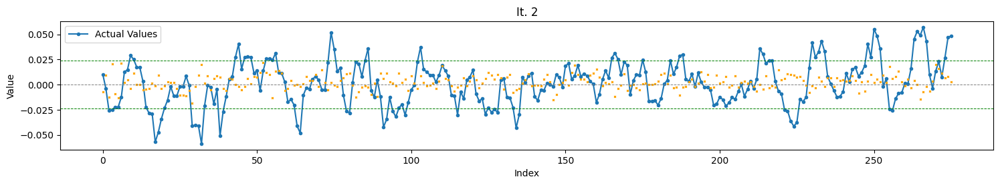

Total TH Pred.: 0
Completed Iteration 2/18

Iteration 3/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 40
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 25, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Input shape: (40, 10)
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_2 (SimpleRNN)    (None, 25)                900       
                                                                 
 dense_2 (Dense)             (None, 1)                 26        
                                                                 
Total params: 926 (3.62 KB)
Trainable params: 926 (3.62 KB)
Non-trainable params: 0

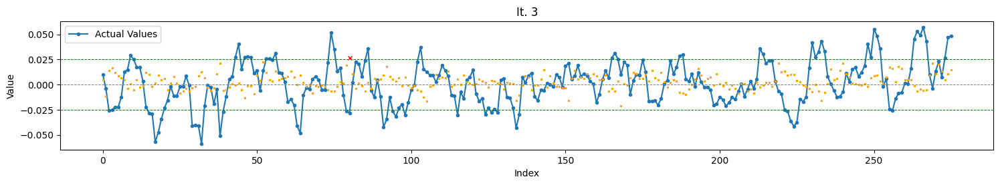

Total TH Pred.: 1
TH Pred. acc. : 0.00
Completed Iteration 3/18

Iteration 4/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 40
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Input shape: (40, 10)
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_3 (SimpleRNN)    (None, 75)                6450      
                                                                 
 dense_3 (Dense)             (None, 1)                 76        
                                                                 
Total params: 6526 (25.49 KB)
Trainable params: 6526 (25.49 KB)

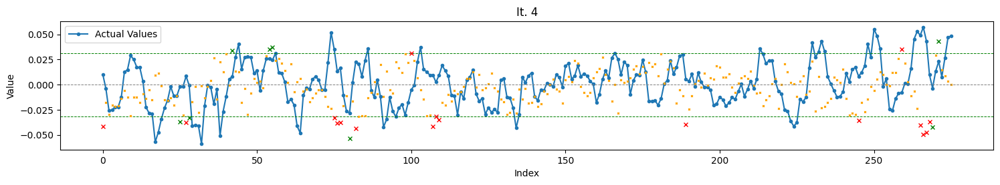

Total TH Pred.: 25
TH Pred. acc. : 32.00
Completed Iteration 4/18

Iteration 5/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 40
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 75, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Input shape: (40, 10)
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_4 (SimpleRNN)    (None, 75)                6450      
                                                                 
 dense_4 (Dense)             (None, 1)                 76        
                                                                 
Total params: 6526 (25.49 KB)
Trainable params: 6526 (25.49 K

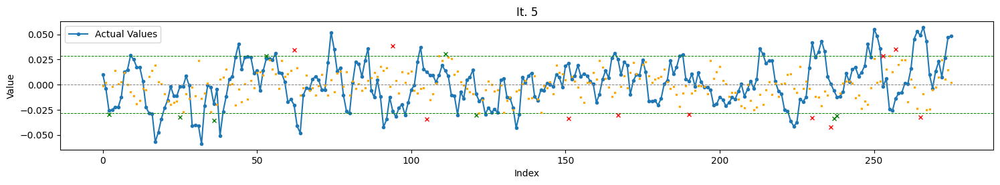

Total TH Pred.: 19
TH Pred. acc. : 42.11
Completed Iteration 5/18

Iteration 6/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 40
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 75, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Input shape: (40, 10)
Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_5 (SimpleRNN)    (None, 75)                6450      
                                                                 
 dense_5 (Dense)             (None, 1)                 76        
                                                                 
Total params: 6526 (25.49 KB)
Trainable params: 6526 (25.49 

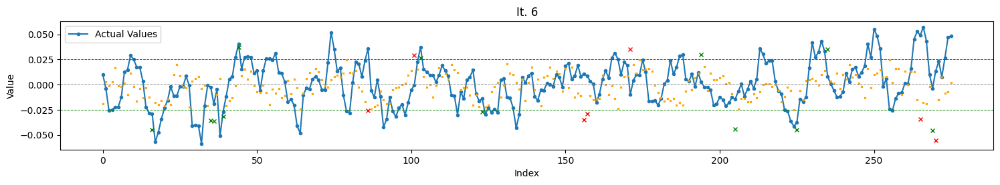

Total TH Pred.: 19
TH Pred. acc. : 63.16
Completed Iteration 6/18

Iteration 7/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 40
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 100, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Input shape: (40, 10)
Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_6 (SimpleRNN)    (None, 100)               11100     
                                                                 
 dense_6 (Dense)             (None, 1)                 101       
                                                                 
Total params: 11201 (43.75 KB)
Trainable params: 11201 (43.7

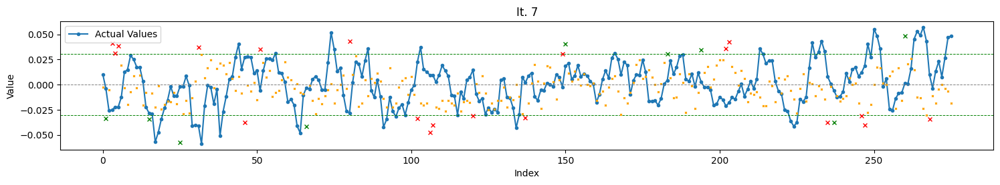

Total TH Pred.: 28
TH Pred. acc. : 32.14
Completed Iteration 7/18

Iteration 8/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 40
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 100, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Input shape: (40, 10)
Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_7 (SimpleRNN)    (None, 100)               11100     
                                                                 
 dense_7 (Dense)             (None, 1)                 101       
                                                                 
Total params: 11201 (43.75 KB)
Trainable params: 11201 (43.7

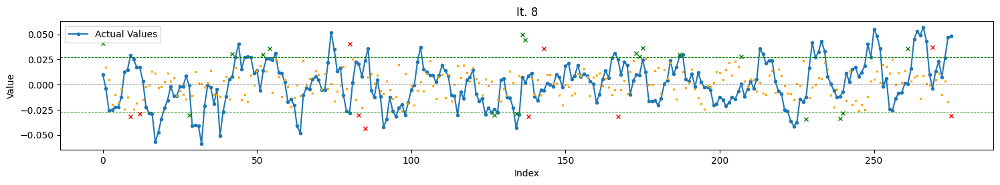

Total TH Pred.: 28
TH Pred. acc. : 64.29
Completed Iteration 8/18

Iteration 9/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 40
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 100, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Input shape: (40, 10)
Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_8 (SimpleRNN)    (None, 100)               11100     
                                                                 
 dense_8 (Dense)             (None, 1)                 101       
                                                                 
Total params: 11201 (43.75 KB)
Trainable params: 11201 (43.

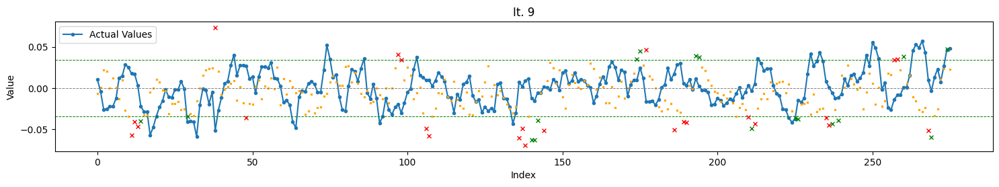

Total TH Pred.: 41
TH Pred. acc. : 41.46
Completed Iteration 9/18

Iteration 10/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 60
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Input shape: (60, 10)
Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_9 (SimpleRNN)    (None, 25)                900       
                                                                 
 dense_9 (Dense)             (None, 1)                 26        
                                                                 
Total params: 926 (3.62 KB)
Trainable params: 926 (3.62 KB)


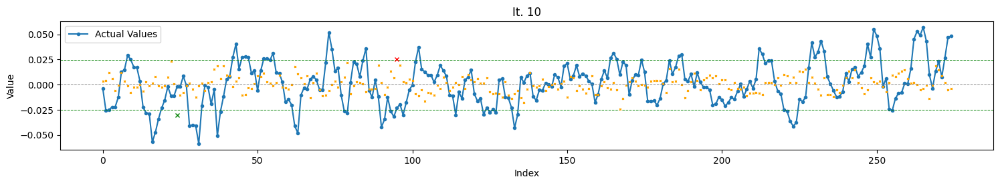

Total TH Pred.: 2
TH Pred. acc. : 50.00
Completed Iteration 10/18

Iteration 11/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 60
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 25, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Input shape: (60, 10)
Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_10 (SimpleRNN)   (None, 25)                900       
                                                                 
 dense_10 (Dense)            (None, 1)                 26        
                                                                 
Total params: 926 (3.62 KB)
Trainable params: 926 (3.62 KB)

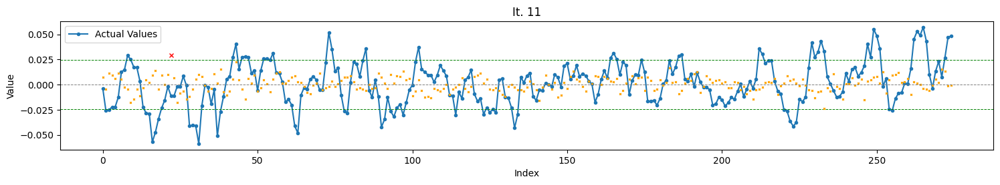

Total TH Pred.: 1
TH Pred. acc. : 0.00
Completed Iteration 11/18

Iteration 12/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 60
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 25, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Input shape: (60, 10)
Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_11 (SimpleRNN)   (None, 25)                900       
                                                                 
 dense_11 (Dense)            (None, 1)                 26        
                                                                 
Total params: 926 (3.62 KB)
Trainable params: 926 (3.62 KB)

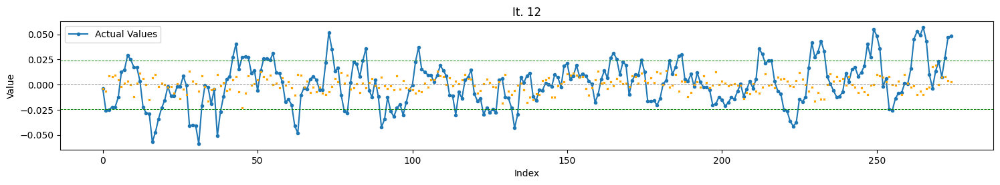

Total TH Pred.: 0
Completed Iteration 12/18

Iteration 13/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 60
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Input shape: (60, 10)
Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_12 (SimpleRNN)   (None, 75)                6450      
                                                                 
 dense_12 (Dense)            (None, 1)                 76        
                                                                 
Total params: 6526 (25.49 KB)
Trainable params: 6526 (25.49 KB)
Non-trainable par

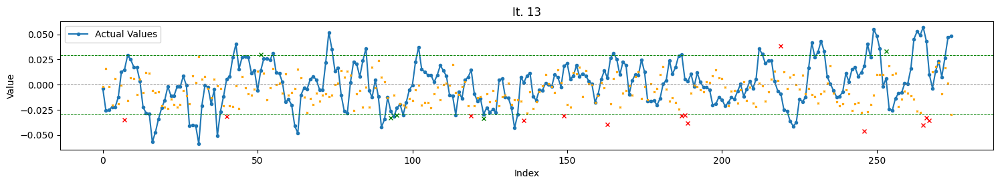

Total TH Pred.: 19
TH Pred. acc. : 26.32
Completed Iteration 13/18

Iteration 14/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 60
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 75, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Input shape: (60, 10)
Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_13 (SimpleRNN)   (None, 75)                6450      
                                                                 
 dense_13 (Dense)            (None, 1)                 76        
                                                                 
Total params: 6526 (25.49 KB)
Trainable params: 6526 (25.4

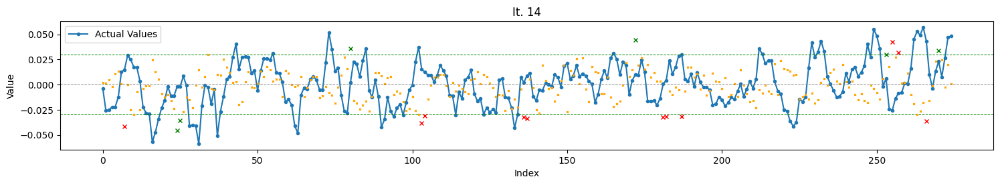

Total TH Pred.: 17
TH Pred. acc. : 35.29
Completed Iteration 14/18

Iteration 15/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 60
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 75, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Input shape: (60, 10)
Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_14 (SimpleRNN)   (None, 75)                6450      
                                                                 
 dense_14 (Dense)            (None, 1)                 76        
                                                                 
Total params: 6526 (25.49 KB)
Trainable params: 6526 (25.

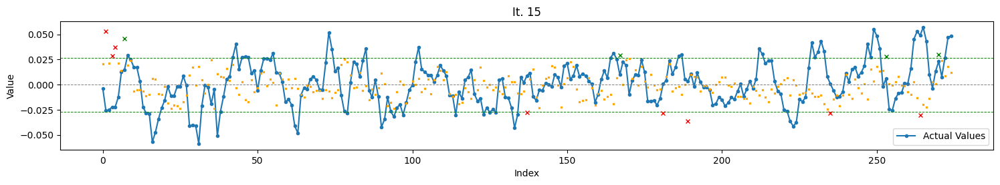

Total TH Pred.: 12
TH Pred. acc. : 33.33
Completed Iteration 15/18

Iteration 16/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 60
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 100, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Input shape: (60, 10)
Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_15 (SimpleRNN)   (None, 100)               11100     
                                                                 
 dense_15 (Dense)            (None, 1)                 101       
                                                                 
Total params: 11201 (43.75 KB)
Trainable params: 11201 (4

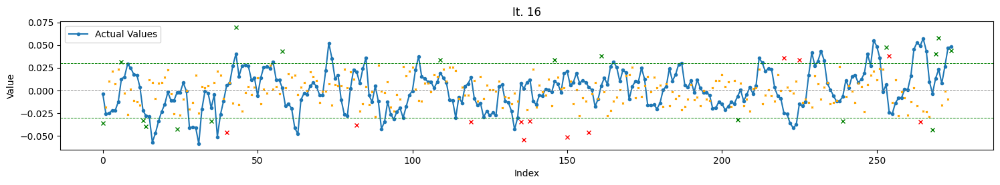

Total TH Pred.: 30
TH Pred. acc. : 60.00
Completed Iteration 16/18

Iteration 17/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 60
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 100, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Input shape: (60, 10)
Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_16 (SimpleRNN)   (None, 100)               11100     
                                                                 
 dense_16 (Dense)            (None, 1)                 101       
                                                                 
Total params: 11201 (43.75 KB)
Trainable params: 11201 (4

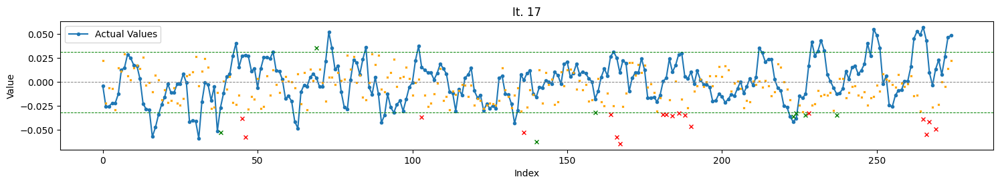

Total TH Pred.: 26
TH Pred. acc. : 30.77
Completed Iteration 17/18

Iteration 18/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 60
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 100, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Input shape: (60, 10)
Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_17 (SimpleRNN)   (None, 100)               11100     
                                                                 
 dense_17 (Dense)            (None, 1)                 101       
                                                                 
Total params: 11201 (43.75 KB)
Trainable params: 11201 (

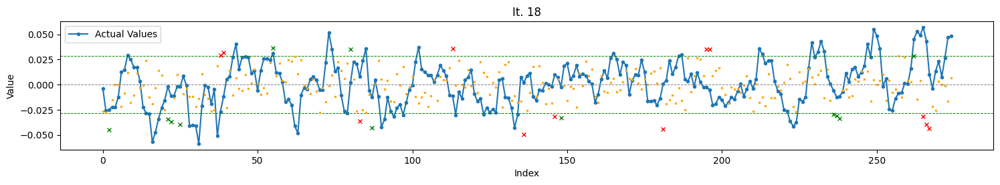

Total TH Pred.: 24
TH Pred. acc. : 50.00
Completed Iteration 18/18


In [15]:
top_results = run_model_iterations()

In [16]:
top_results_sort = sorted(top_results, key=lambda x: x['diff'])[:15]

Top 1 - 0.5
RMSE: 0.025250, STD_DEV: 0.021968, STD_PRD: 0.014859, OBJDIFF: 0.006836, RDIFF: 0.003281
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.026543, inv. diff> 0.008129
Trend accuracy       : 52.364
Trend up accuracy    : 47.945
Trend down accuracy  : 57.364


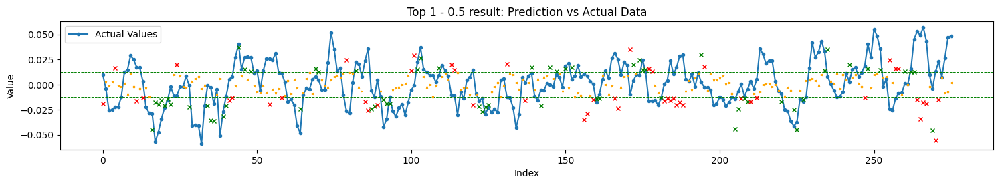

Total TH Pred.: 112
TH Pred. acc. : 56.25


Top 2 - 0.5
RMSE: 0.027104, STD_DEV: 0.021968, STD_PRD: 0.015857, OBJDIFF: 0.008191, RDIFF: 0.005135
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027177, inv. diff> 0.008264
Trend accuracy       : 50.182
Trend up accuracy    : 54.110
Trend down accuracy  : 45.736


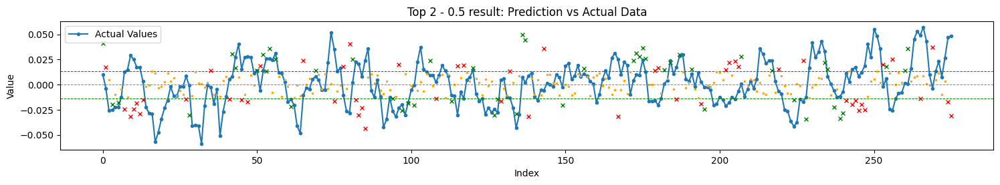

Total TH Pred.: 102
TH Pred. acc. : 49.02


Top 3 - 0.5
RMSE: 0.026751, STD_DEV: 0.022002, STD_PRD: 0.013419, OBJDIFF: 0.009040, RDIFF: 0.004749
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.025771, inv. diff> 0.008061
Trend accuracy       : 49.635
Trend up accuracy    : 41.379
Trend down accuracy  : 58.915


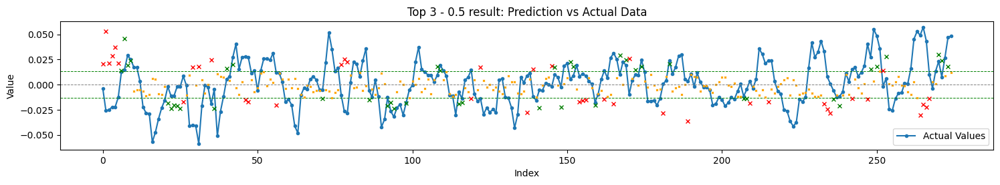

Total TH Pred.: 84
TH Pred. acc. : 51.19


Top 4 - 0.5
RMSE: 0.028593, STD_DEV: 0.022002, STD_PRD: 0.016926, OBJDIFF: 0.009130, RDIFF: 0.006592
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027780, inv. diff> 0.008316
Trend accuracy       : 47.080
Trend up accuracy    : 42.759
Trend down accuracy  : 51.938


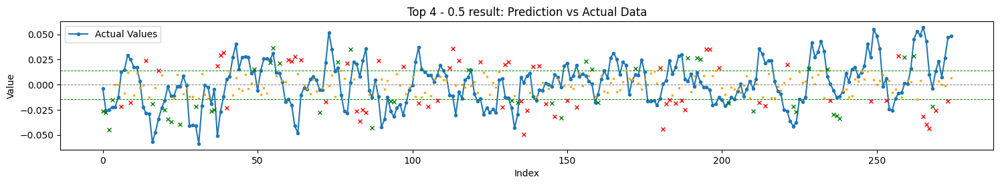

Total TH Pred.: 107
TH Pred. acc. : 42.99


Top 5 - 0.5
RMSE: 0.024741, STD_DEV: 0.021968, STD_PRD: 0.009200, OBJDIFF: 0.009156, RDIFF: 0.002772
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023818, inv. diff> 0.008234
Trend accuracy       : 48.727
Trend up accuracy    : 43.836
Trend down accuracy  : 54.264


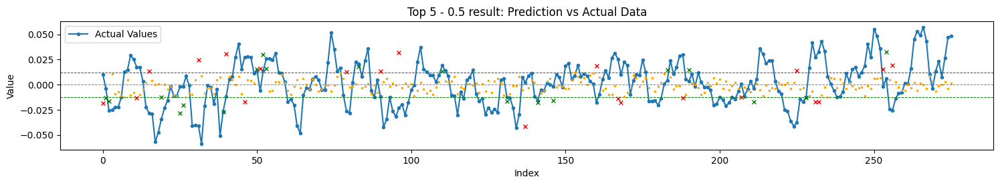

Total TH Pred.: 40
TH Pred. acc. : 47.50


Top 6 - 0.5
RMSE: 0.023835, STD_DEV: 0.021968, STD_PRD: 0.007019, OBJDIFF: 0.009341, RDIFF: 0.001866
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023350, inv. diff> 0.008856
Trend accuracy       : 48.727
Trend up accuracy    : 60.274
Trend down accuracy  : 35.659


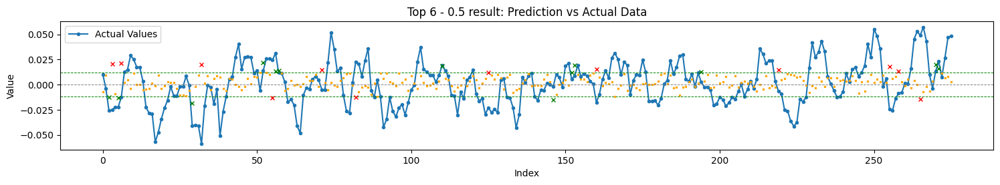

Total TH Pred.: 25
TH Pred. acc. : 52.00


Top 7 - 0.5
RMSE: 0.029913, STD_DEV: 0.022002, STD_PRD: 0.018920, OBJDIFF: 0.009453, RDIFF: 0.007912
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.029018, inv. diff> 0.008558
Trend accuracy       : 44.891
Trend up accuracy    : 43.448
Trend down accuracy  : 46.512


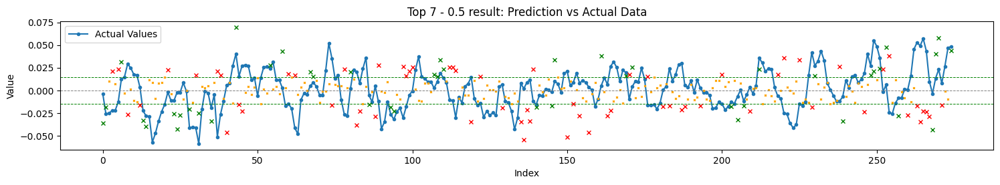

Total TH Pred.: 109
TH Pred. acc. : 41.28


Top 8 - 0.5
RMSE: 0.024096, STD_DEV: 0.022002, STD_PRD: 0.007117, OBJDIFF: 0.009537, RDIFF: 0.002095
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023173, inv. diff> 0.008614
Trend accuracy       : 47.445
Trend up accuracy    : 51.724
Trend down accuracy  : 42.636


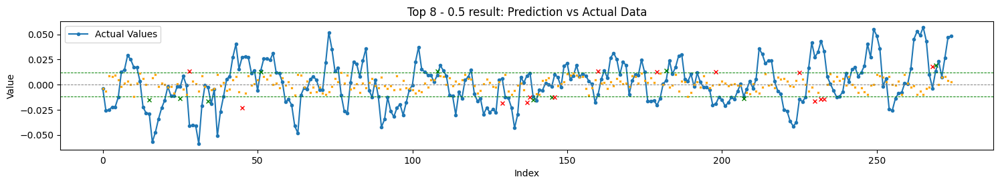

Total TH Pred.: 24
TH Pred. acc. : 41.67


Top 9 - 0.5
RMSE: 0.024771, STD_DEV: 0.022002, STD_PRD: 0.008135, OBJDIFF: 0.009703, RDIFF: 0.002770
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023517, inv. diff> 0.008449
Trend accuracy       : 43.431
Trend up accuracy    : 46.897
Trend down accuracy  : 39.535


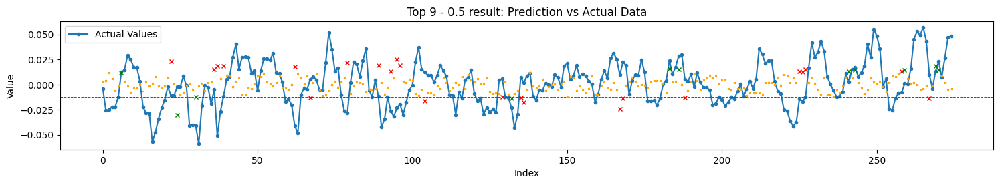

Total TH Pred.: 34
TH Pred. acc. : 32.35


Top 10 - 0.5
RMSE: 0.024533, STD_DEV: 0.022002, STD_PRD: 0.007475, OBJDIFF: 0.009795, RDIFF: 0.002531
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023295, inv. diff> 0.008556
Trend accuracy       : 45.255
Trend up accuracy    : 50.345
Trend down accuracy  : 39.535


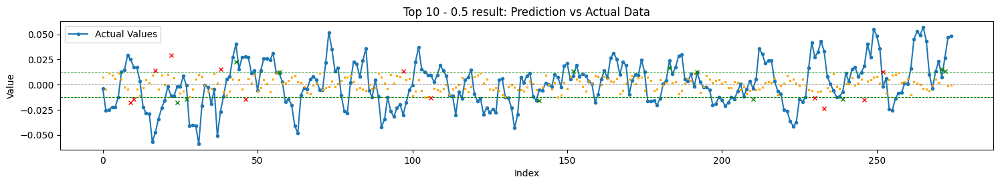

Total TH Pred.: 24
TH Pred. acc. : 50.00


Top 11 - 0.5
RMSE: 0.028523, STD_DEV: 0.021968, STD_PRD: 0.014947, OBJDIFF: 0.010065, RDIFF: 0.006555
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.026571, inv. diff> 0.008113
Trend accuracy       : 44.000
Trend up accuracy    : 41.096
Trend down accuracy  : 47.287


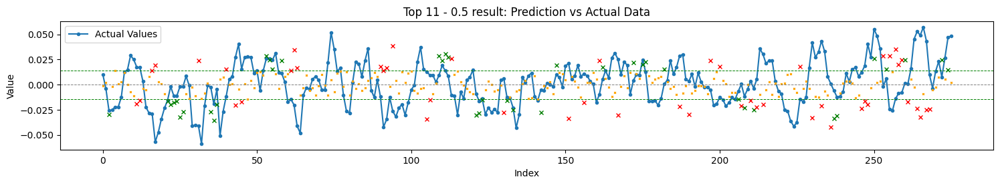

Total TH Pred.: 88
TH Pred. acc. : 45.45


Top 12 - 0.5
RMSE: 0.030295, STD_DEV: 0.021968, STD_PRD: 0.017987, OBJDIFF: 0.010317, RDIFF: 0.008326
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.028495, inv. diff> 0.008517
Trend accuracy       : 47.273
Trend up accuracy    : 39.726
Trend down accuracy  : 55.814


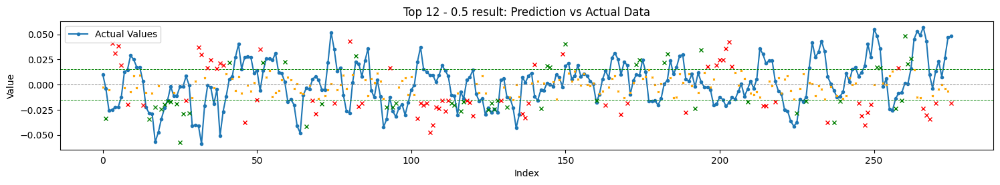

Total TH Pred.: 122
TH Pred. acc. : 42.62


Top 13 - 0.5
RMSE: 0.025215, STD_DEV: 0.021968, STD_PRD: 0.007600, OBJDIFF: 0.010431, RDIFF: 0.003247
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023599, inv. diff> 0.008815
Trend accuracy       : 44.364
Trend up accuracy    : 56.164
Trend down accuracy  : 31.008


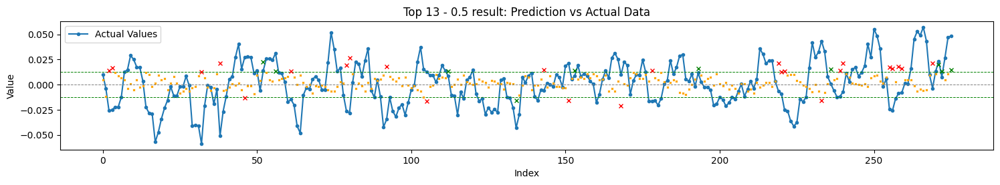

Total TH Pred.: 35
TH Pred. acc. : 28.57


Top 14 - 0.5
RMSE: 0.029828, STD_DEV: 0.022002, STD_PRD: 0.015809, OBJDIFF: 0.010923, RDIFF: 0.007827
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027100, inv. diff> 0.008195
Trend accuracy       : 43.796
Trend up accuracy    : 40.000
Trend down accuracy  : 48.062


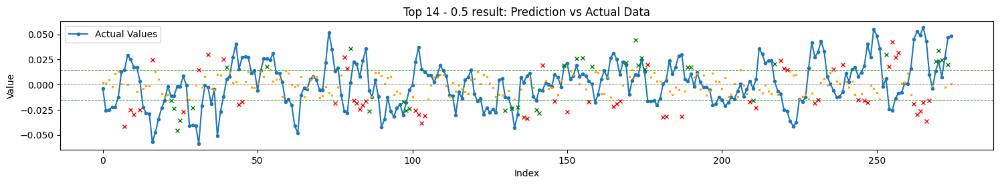

Total TH Pred.: 93
TH Pred. acc. : 37.63


Top 15 - 0.5
RMSE: 0.031365, STD_DEV: 0.021968, STD_PRD: 0.018386, OBJDIFF: 0.011188, RDIFF: 0.009397
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.028790, inv. diff> 0.008613
Trend accuracy       : 44.364
Trend up accuracy    : 37.671
Trend down accuracy  : 51.938


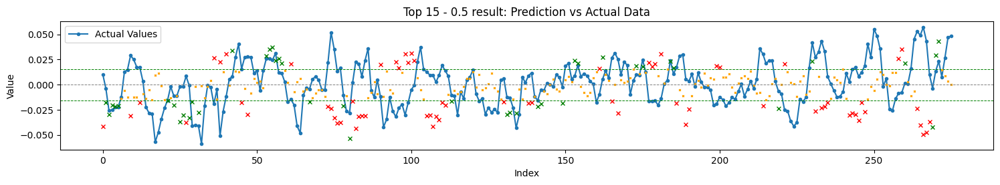

Total TH Pred.: 110
TH Pred. acc. : 38.18


Top 1 - 0.6
RMSE: 0.025250, STD_DEV: 0.021968, STD_PRD: 0.014859, OBJDIFF: 0.006836, RDIFF: 0.003281
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.026543, inv. diff> 0.008129
Trend accuracy       : 52.364
Trend up accuracy    : 47.945
Trend down accuracy  : 57.364


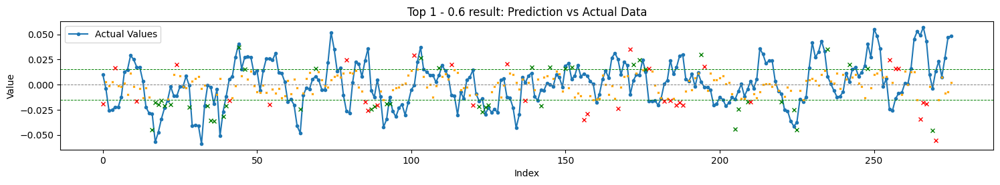

Total TH Pred.: 79
TH Pred. acc. : 56.96


Top 2 - 0.6
RMSE: 0.027104, STD_DEV: 0.021968, STD_PRD: 0.015857, OBJDIFF: 0.008191, RDIFF: 0.005135
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027177, inv. diff> 0.008264
Trend accuracy       : 50.182
Trend up accuracy    : 54.110
Trend down accuracy  : 45.736


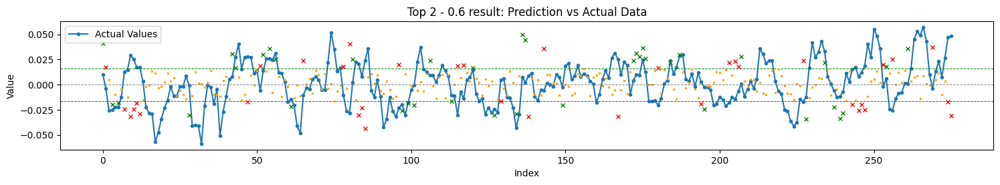

Total TH Pred.: 74
TH Pred. acc. : 51.35


Top 3 - 0.6
RMSE: 0.026751, STD_DEV: 0.022002, STD_PRD: 0.013419, OBJDIFF: 0.009040, RDIFF: 0.004749
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.025771, inv. diff> 0.008061
Trend accuracy       : 49.635
Trend up accuracy    : 41.379
Trend down accuracy  : 58.915


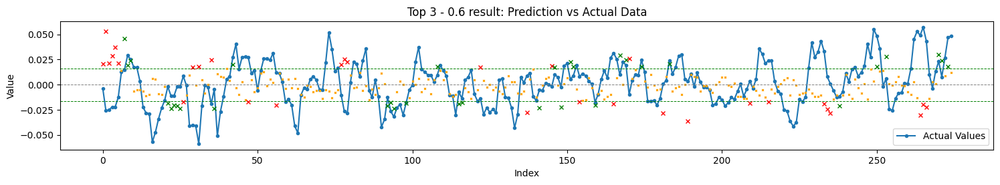

Total TH Pred.: 64
TH Pred. acc. : 51.56


Top 4 - 0.6
RMSE: 0.028593, STD_DEV: 0.022002, STD_PRD: 0.016926, OBJDIFF: 0.009130, RDIFF: 0.006592
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027780, inv. diff> 0.008316
Trend accuracy       : 47.080
Trend up accuracy    : 42.759
Trend down accuracy  : 51.938


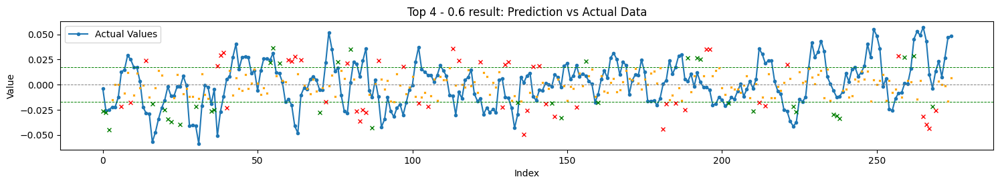

Total TH Pred.: 84
TH Pred. acc. : 42.86


Top 5 - 0.6
RMSE: 0.024741, STD_DEV: 0.021968, STD_PRD: 0.009200, OBJDIFF: 0.009156, RDIFF: 0.002772
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023818, inv. diff> 0.008234
Trend accuracy       : 48.727
Trend up accuracy    : 43.836
Trend down accuracy  : 54.264


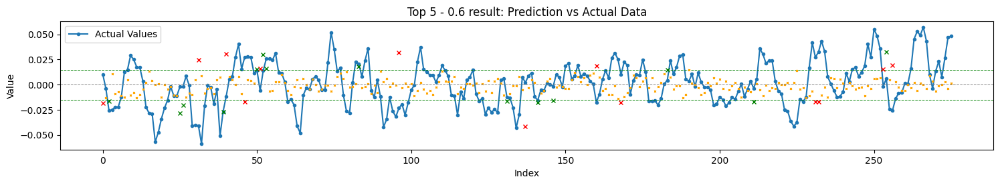

Total TH Pred.: 27
TH Pred. acc. : 51.85


Top 6 - 0.6
RMSE: 0.023835, STD_DEV: 0.021968, STD_PRD: 0.007019, OBJDIFF: 0.009341, RDIFF: 0.001866
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023350, inv. diff> 0.008856
Trend accuracy       : 48.727
Trend up accuracy    : 60.274
Trend down accuracy  : 35.659


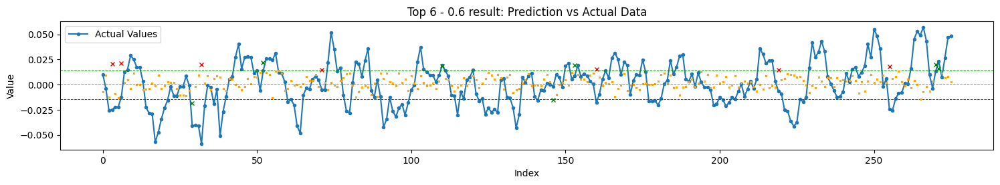

Total TH Pred.: 14
TH Pred. acc. : 50.00


Top 7 - 0.6
RMSE: 0.029913, STD_DEV: 0.022002, STD_PRD: 0.018920, OBJDIFF: 0.009453, RDIFF: 0.007912
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.029018, inv. diff> 0.008558
Trend accuracy       : 44.891
Trend up accuracy    : 43.448
Trend down accuracy  : 46.512


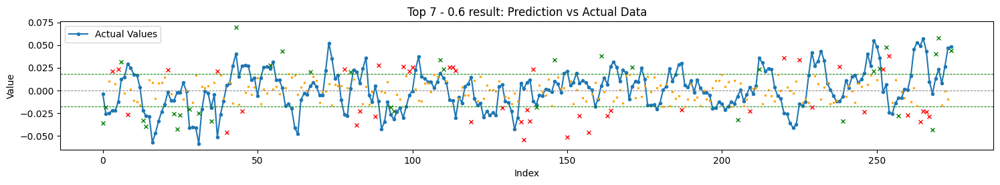

Total TH Pred.: 79
TH Pred. acc. : 44.30


Top 8 - 0.6
RMSE: 0.024096, STD_DEV: 0.022002, STD_PRD: 0.007117, OBJDIFF: 0.009537, RDIFF: 0.002095
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023173, inv. diff> 0.008614
Trend accuracy       : 47.445
Trend up accuracy    : 51.724
Trend down accuracy  : 42.636


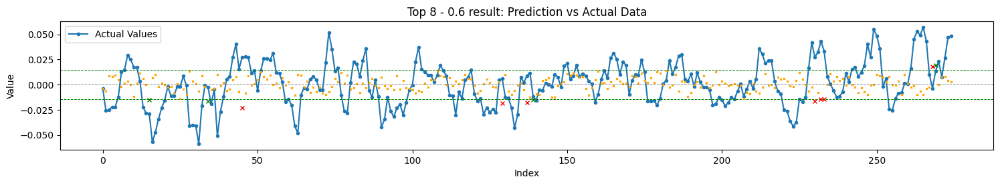

Total TH Pred.: 11
TH Pred. acc. : 36.36


Top 9 - 0.6
RMSE: 0.024771, STD_DEV: 0.022002, STD_PRD: 0.008135, OBJDIFF: 0.009703, RDIFF: 0.002770
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023517, inv. diff> 0.008449
Trend accuracy       : 43.431
Trend up accuracy    : 46.897
Trend down accuracy  : 39.535


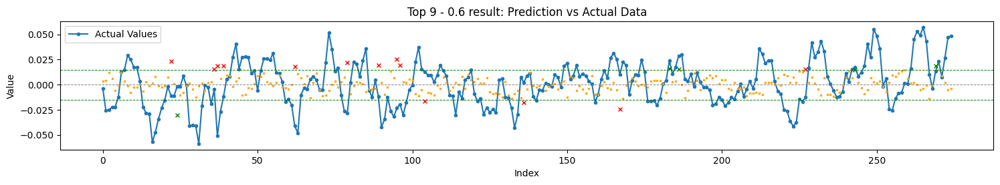

Total TH Pred.: 18
TH Pred. acc. : 27.78


Top 10 - 0.6
RMSE: 0.024533, STD_DEV: 0.022002, STD_PRD: 0.007475, OBJDIFF: 0.009795, RDIFF: 0.002531
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023295, inv. diff> 0.008556
Trend accuracy       : 45.255
Trend up accuracy    : 50.345
Trend down accuracy  : 39.535


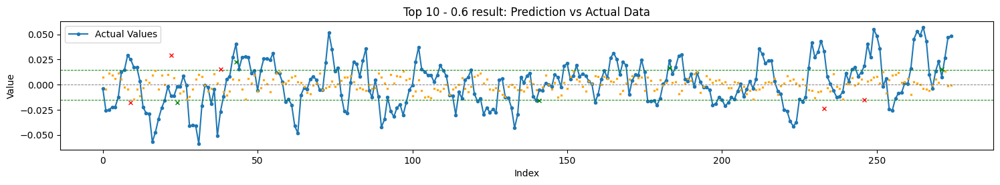

Total TH Pred.: 10
TH Pred. acc. : 50.00


Top 11 - 0.6
RMSE: 0.028523, STD_DEV: 0.021968, STD_PRD: 0.014947, OBJDIFF: 0.010065, RDIFF: 0.006555
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.026571, inv. diff> 0.008113
Trend accuracy       : 44.000
Trend up accuracy    : 41.096
Trend down accuracy  : 47.287


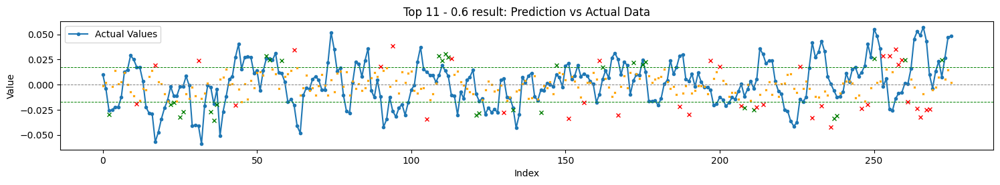

Total TH Pred.: 68
TH Pred. acc. : 45.59


Top 12 - 0.6
RMSE: 0.030295, STD_DEV: 0.021968, STD_PRD: 0.017987, OBJDIFF: 0.010317, RDIFF: 0.008326
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.028495, inv. diff> 0.008517
Trend accuracy       : 47.273
Trend up accuracy    : 39.726
Trend down accuracy  : 55.814


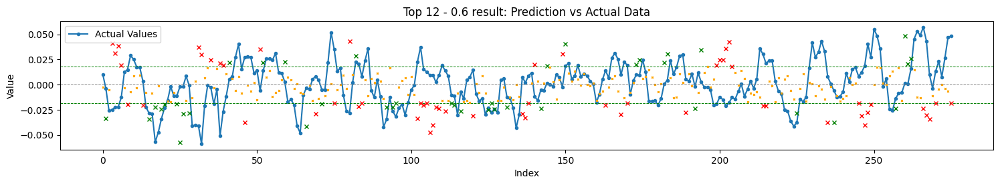

Total TH Pred.: 96
TH Pred. acc. : 41.67


Top 13 - 0.6
RMSE: 0.025215, STD_DEV: 0.021968, STD_PRD: 0.007600, OBJDIFF: 0.010431, RDIFF: 0.003247
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023599, inv. diff> 0.008815
Trend accuracy       : 44.364
Trend up accuracy    : 56.164
Trend down accuracy  : 31.008


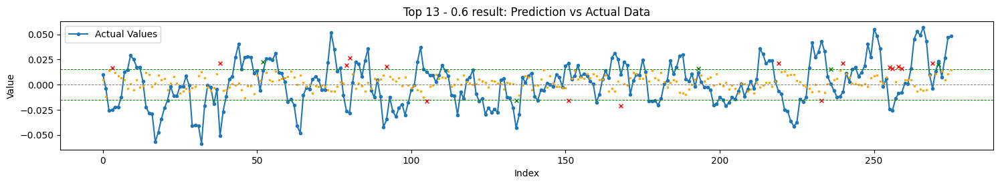

Total TH Pred.: 21
TH Pred. acc. : 23.81


Top 14 - 0.6
RMSE: 0.029828, STD_DEV: 0.022002, STD_PRD: 0.015809, OBJDIFF: 0.010923, RDIFF: 0.007827
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027100, inv. diff> 0.008195
Trend accuracy       : 43.796
Trend up accuracy    : 40.000
Trend down accuracy  : 48.062


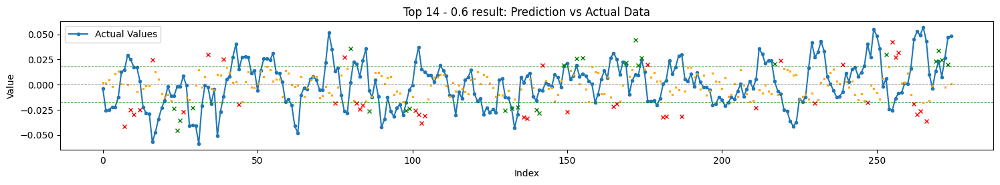

Total TH Pred.: 66
TH Pred. acc. : 39.39


Top 15 - 0.6
RMSE: 0.031365, STD_DEV: 0.021968, STD_PRD: 0.018386, OBJDIFF: 0.011188, RDIFF: 0.009397
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.028790, inv. diff> 0.008613
Trend accuracy       : 44.364
Trend up accuracy    : 37.671
Trend down accuracy  : 51.938


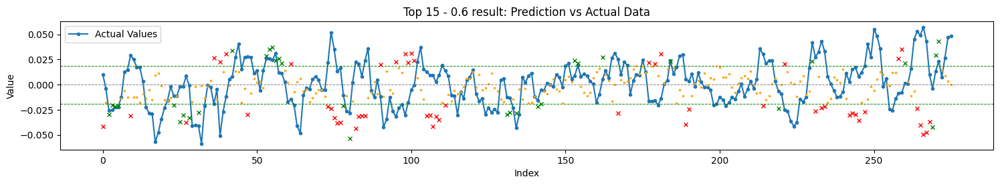

Total TH Pred.: 85
TH Pred. acc. : 38.82


Top 1 - 0.7
RMSE: 0.025250, STD_DEV: 0.021968, STD_PRD: 0.014859, OBJDIFF: 0.006836, RDIFF: 0.003281
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.026543, inv. diff> 0.008129
Trend accuracy       : 52.364
Trend up accuracy    : 47.945
Trend down accuracy  : 57.364


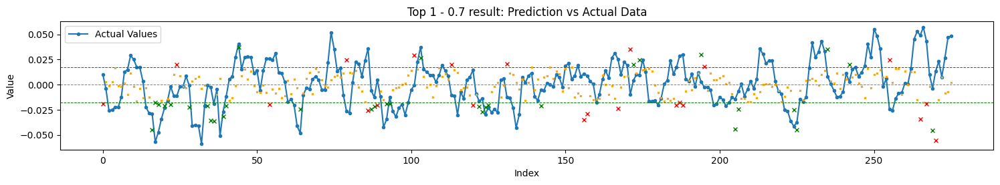

Total TH Pred.: 55
TH Pred. acc. : 60.00


Top 2 - 0.7
RMSE: 0.027104, STD_DEV: 0.021968, STD_PRD: 0.015857, OBJDIFF: 0.008191, RDIFF: 0.005135
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027177, inv. diff> 0.008264
Trend accuracy       : 50.182
Trend up accuracy    : 54.110
Trend down accuracy  : 45.736


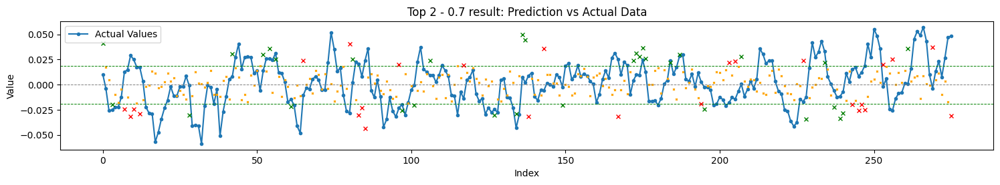

Total TH Pred.: 58
TH Pred. acc. : 55.17


Top 3 - 0.7
RMSE: 0.026751, STD_DEV: 0.022002, STD_PRD: 0.013419, OBJDIFF: 0.009040, RDIFF: 0.004749
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.025771, inv. diff> 0.008061
Trend accuracy       : 49.635
Trend up accuracy    : 41.379
Trend down accuracy  : 58.915


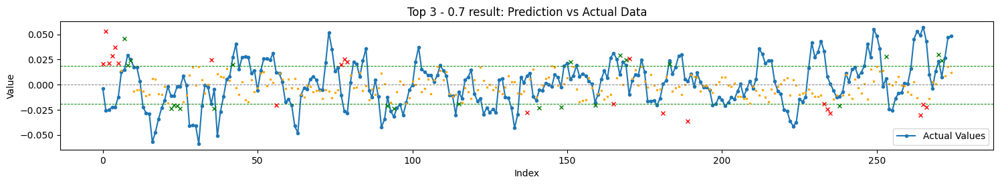

Total TH Pred.: 45
TH Pred. acc. : 51.11


Top 4 - 0.7
RMSE: 0.028593, STD_DEV: 0.022002, STD_PRD: 0.016926, OBJDIFF: 0.009130, RDIFF: 0.006592
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027780, inv. diff> 0.008316
Trend accuracy       : 47.080
Trend up accuracy    : 42.759
Trend down accuracy  : 51.938


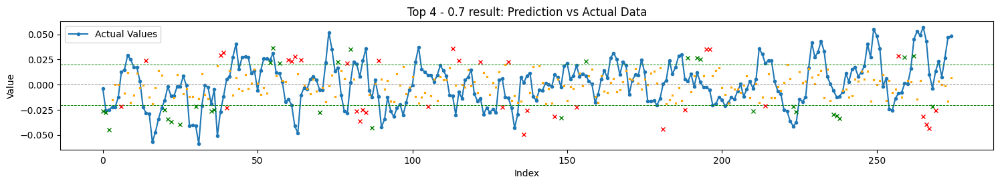

Total TH Pred.: 66
TH Pred. acc. : 46.97


Top 5 - 0.7
RMSE: 0.024741, STD_DEV: 0.021968, STD_PRD: 0.009200, OBJDIFF: 0.009156, RDIFF: 0.002772
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023818, inv. diff> 0.008234
Trend accuracy       : 48.727
Trend up accuracy    : 43.836
Trend down accuracy  : 54.264


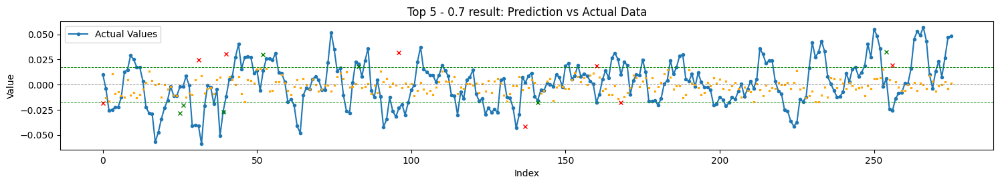

Total TH Pred.: 15
TH Pred. acc. : 46.67


Top 6 - 0.7
RMSE: 0.023835, STD_DEV: 0.021968, STD_PRD: 0.007019, OBJDIFF: 0.009341, RDIFF: 0.001866
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023350, inv. diff> 0.008856
Trend accuracy       : 48.727
Trend up accuracy    : 60.274
Trend down accuracy  : 35.659


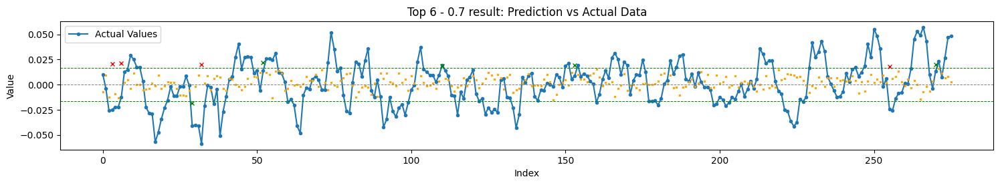

Total TH Pred.: 9
TH Pred. acc. : 55.56


Top 7 - 0.7
RMSE: 0.029913, STD_DEV: 0.022002, STD_PRD: 0.018920, OBJDIFF: 0.009453, RDIFF: 0.007912
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.029018, inv. diff> 0.008558
Trend accuracy       : 44.891
Trend up accuracy    : 43.448
Trend down accuracy  : 46.512


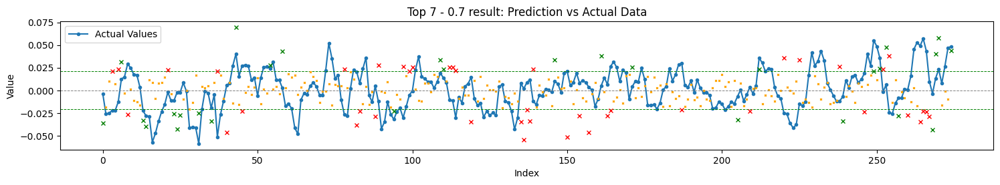

Total TH Pred.: 71
TH Pred. acc. : 40.85


Top 8 - 0.7
RMSE: 0.024096, STD_DEV: 0.022002, STD_PRD: 0.007117, OBJDIFF: 0.009537, RDIFF: 0.002095
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023173, inv. diff> 0.008614
Trend accuracy       : 47.445
Trend up accuracy    : 51.724
Trend down accuracy  : 42.636


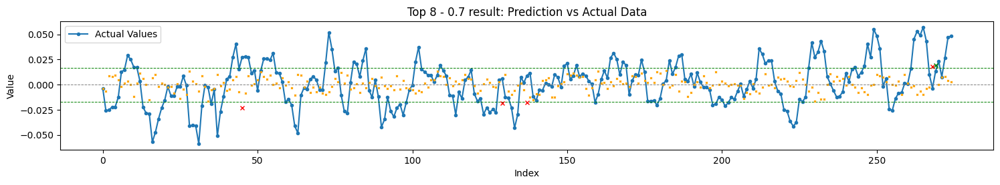

Total TH Pred.: 5
TH Pred. acc. : 20.00


Top 9 - 0.7
RMSE: 0.024771, STD_DEV: 0.022002, STD_PRD: 0.008135, OBJDIFF: 0.009703, RDIFF: 0.002770
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023517, inv. diff> 0.008449
Trend accuracy       : 43.431
Trend up accuracy    : 46.897
Trend down accuracy  : 39.535


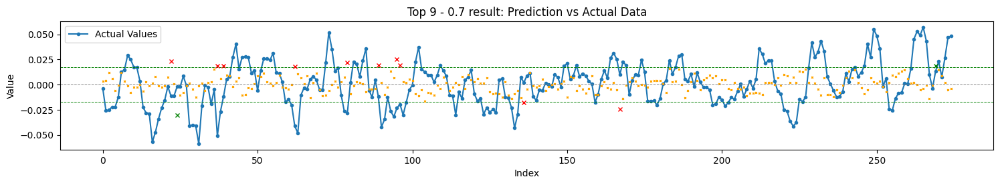

Total TH Pred.: 12
TH Pred. acc. : 16.67


Top 10 - 0.7
RMSE: 0.024533, STD_DEV: 0.022002, STD_PRD: 0.007475, OBJDIFF: 0.009795, RDIFF: 0.002531
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023295, inv. diff> 0.008556
Trend accuracy       : 45.255
Trend up accuracy    : 50.345
Trend down accuracy  : 39.535


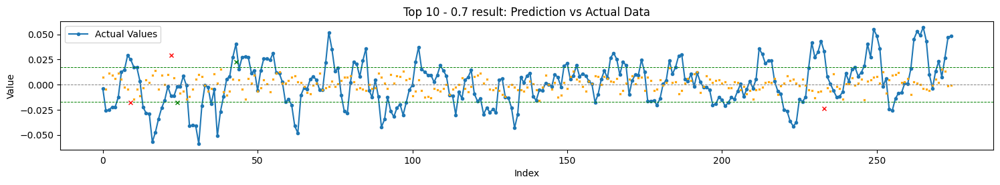

Total TH Pred.: 5
TH Pred. acc. : 40.00


Top 11 - 0.7
RMSE: 0.028523, STD_DEV: 0.021968, STD_PRD: 0.014947, OBJDIFF: 0.010065, RDIFF: 0.006555
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.026571, inv. diff> 0.008113
Trend accuracy       : 44.000
Trend up accuracy    : 41.096
Trend down accuracy  : 47.287


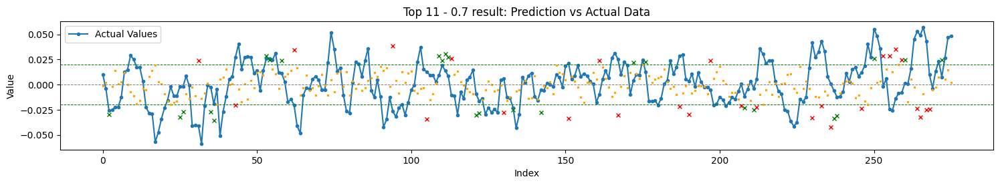

Total TH Pred.: 52
TH Pred. acc. : 48.08


Top 12 - 0.7
RMSE: 0.030295, STD_DEV: 0.021968, STD_PRD: 0.017987, OBJDIFF: 0.010317, RDIFF: 0.008326
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.028495, inv. diff> 0.008517
Trend accuracy       : 47.273
Trend up accuracy    : 39.726
Trend down accuracy  : 55.814


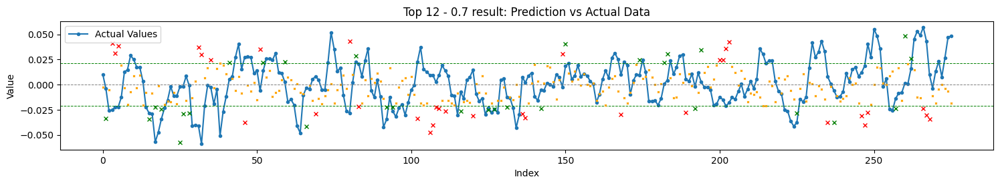

Total TH Pred.: 64
TH Pred. acc. : 46.88


Top 13 - 0.7
RMSE: 0.025215, STD_DEV: 0.021968, STD_PRD: 0.007600, OBJDIFF: 0.010431, RDIFF: 0.003247
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023599, inv. diff> 0.008815
Trend accuracy       : 44.364
Trend up accuracy    : 56.164
Trend down accuracy  : 31.008


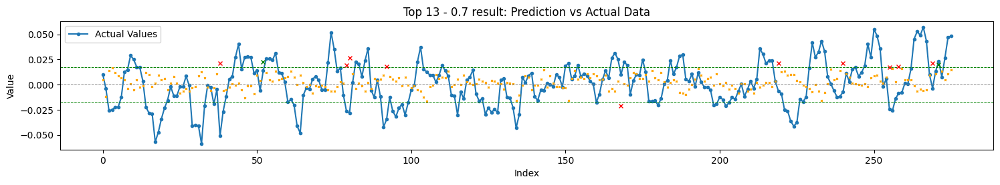

Total TH Pred.: 12
TH Pred. acc. : 16.67


Top 14 - 0.7
RMSE: 0.029828, STD_DEV: 0.022002, STD_PRD: 0.015809, OBJDIFF: 0.010923, RDIFF: 0.007827
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027100, inv. diff> 0.008195
Trend accuracy       : 43.796
Trend up accuracy    : 40.000
Trend down accuracy  : 48.062


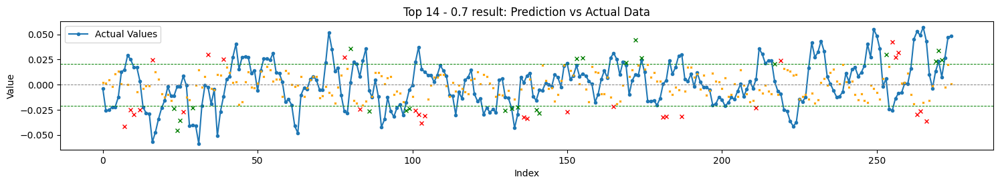

Total TH Pred.: 52
TH Pred. acc. : 44.23


Top 15 - 0.7
RMSE: 0.031365, STD_DEV: 0.021968, STD_PRD: 0.018386, OBJDIFF: 0.011188, RDIFF: 0.009397
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.028790, inv. diff> 0.008613
Trend accuracy       : 44.364
Trend up accuracy    : 37.671
Trend down accuracy  : 51.938


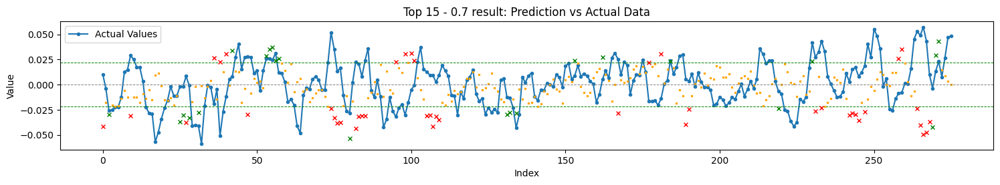

Total TH Pred.: 66
TH Pred. acc. : 34.85


Top 1 - 0.8
RMSE: 0.025250, STD_DEV: 0.021968, STD_PRD: 0.014859, OBJDIFF: 0.006836, RDIFF: 0.003281
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.026543, inv. diff> 0.008129
Trend accuracy       : 52.364
Trend up accuracy    : 47.945
Trend down accuracy  : 57.364


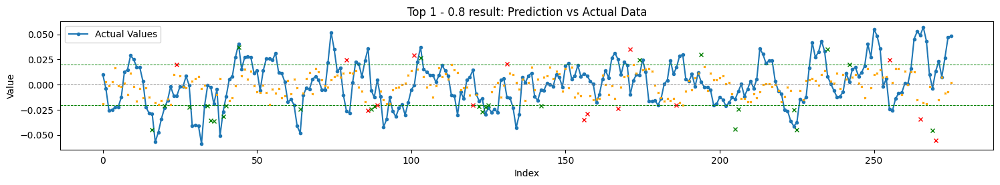

Total TH Pred.: 42
TH Pred. acc. : 64.29


Top 2 - 0.8
RMSE: 0.027104, STD_DEV: 0.021968, STD_PRD: 0.015857, OBJDIFF: 0.008191, RDIFF: 0.005135
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027177, inv. diff> 0.008264
Trend accuracy       : 50.182
Trend up accuracy    : 54.110
Trend down accuracy  : 45.736


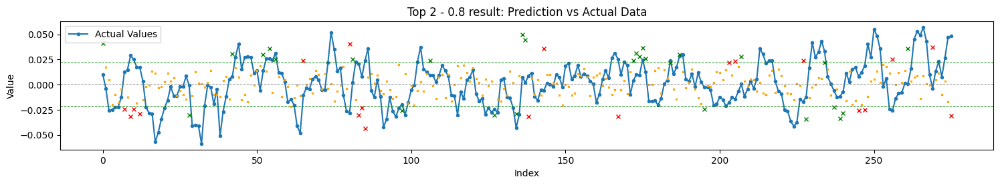

Total TH Pred.: 48
TH Pred. acc. : 58.33


Top 3 - 0.8
RMSE: 0.026751, STD_DEV: 0.022002, STD_PRD: 0.013419, OBJDIFF: 0.009040, RDIFF: 0.004749
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.025771, inv. diff> 0.008061
Trend accuracy       : 49.635
Trend up accuracy    : 41.379
Trend down accuracy  : 58.915


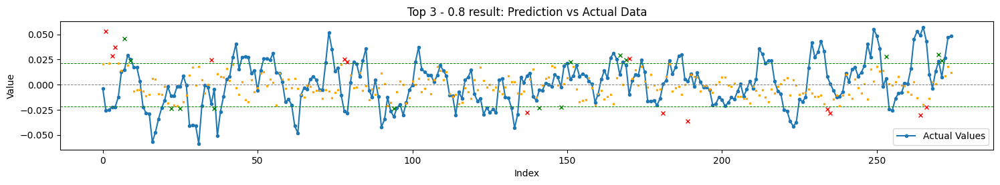

Total TH Pred.: 28
TH Pred. acc. : 50.00


Top 4 - 0.8
RMSE: 0.028593, STD_DEV: 0.022002, STD_PRD: 0.016926, OBJDIFF: 0.009130, RDIFF: 0.006592
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027780, inv. diff> 0.008316
Trend accuracy       : 47.080
Trend up accuracy    : 42.759
Trend down accuracy  : 51.938


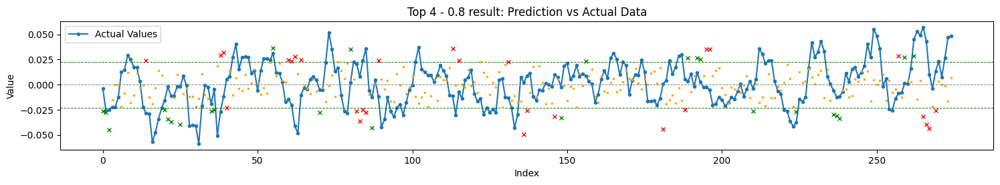

Total TH Pred.: 53
TH Pred. acc. : 47.17


Top 5 - 0.8
RMSE: 0.024741, STD_DEV: 0.021968, STD_PRD: 0.009200, OBJDIFF: 0.009156, RDIFF: 0.002772
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023818, inv. diff> 0.008234
Trend accuracy       : 48.727
Trend up accuracy    : 43.836
Trend down accuracy  : 54.264


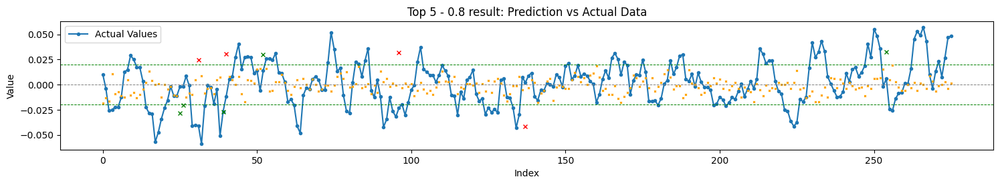

Total TH Pred.: 9
TH Pred. acc. : 55.56


Top 6 - 0.8
RMSE: 0.023835, STD_DEV: 0.021968, STD_PRD: 0.007019, OBJDIFF: 0.009341, RDIFF: 0.001866
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023350, inv. diff> 0.008856
Trend accuracy       : 48.727
Trend up accuracy    : 60.274
Trend down accuracy  : 35.659


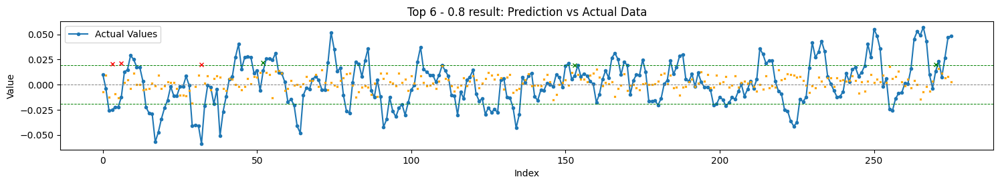

Total TH Pred.: 6
TH Pred. acc. : 50.00


Top 7 - 0.8
RMSE: 0.029913, STD_DEV: 0.022002, STD_PRD: 0.018920, OBJDIFF: 0.009453, RDIFF: 0.007912
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.029018, inv. diff> 0.008558
Trend accuracy       : 44.891
Trend up accuracy    : 43.448
Trend down accuracy  : 46.512


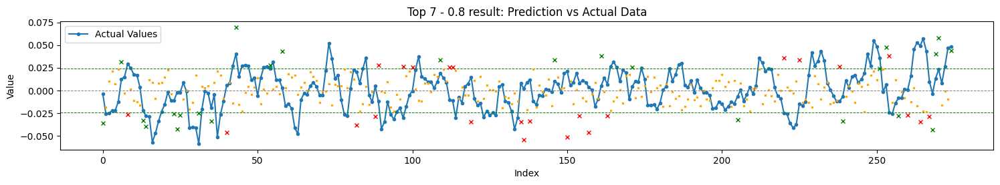

Total TH Pred.: 49
TH Pred. acc. : 51.02


Top 8 - 0.8
RMSE: 0.024096, STD_DEV: 0.022002, STD_PRD: 0.007117, OBJDIFF: 0.009537, RDIFF: 0.002095
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023173, inv. diff> 0.008614
Trend accuracy       : 47.445
Trend up accuracy    : 51.724
Trend down accuracy  : 42.636


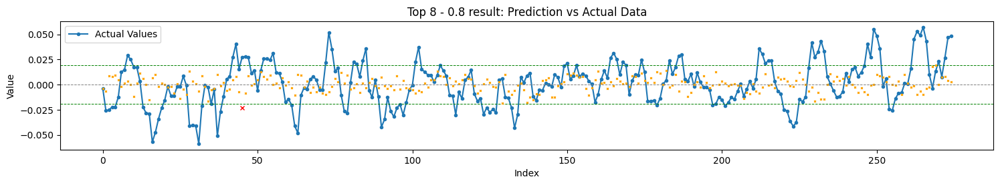

Total TH Pred.: 1
TH Pred. acc. : 0.00


Top 9 - 0.8
RMSE: 0.024771, STD_DEV: 0.022002, STD_PRD: 0.008135, OBJDIFF: 0.009703, RDIFF: 0.002770
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023517, inv. diff> 0.008449
Trend accuracy       : 43.431
Trend up accuracy    : 46.897
Trend down accuracy  : 39.535


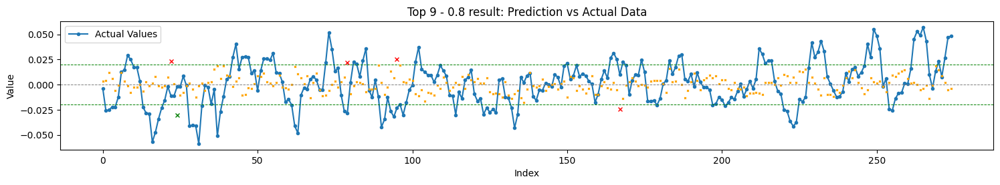

Total TH Pred.: 5
TH Pred. acc. : 20.00


Top 10 - 0.8
RMSE: 0.024533, STD_DEV: 0.022002, STD_PRD: 0.007475, OBJDIFF: 0.009795, RDIFF: 0.002531
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023295, inv. diff> 0.008556
Trend accuracy       : 45.255
Trend up accuracy    : 50.345
Trend down accuracy  : 39.535


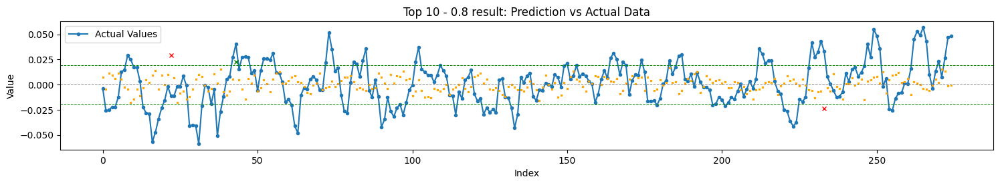

Total TH Pred.: 3
TH Pred. acc. : 33.33


Top 11 - 0.8
RMSE: 0.028523, STD_DEV: 0.021968, STD_PRD: 0.014947, OBJDIFF: 0.010065, RDIFF: 0.006555
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.026571, inv. diff> 0.008113
Trend accuracy       : 44.000
Trend up accuracy    : 41.096
Trend down accuracy  : 47.287


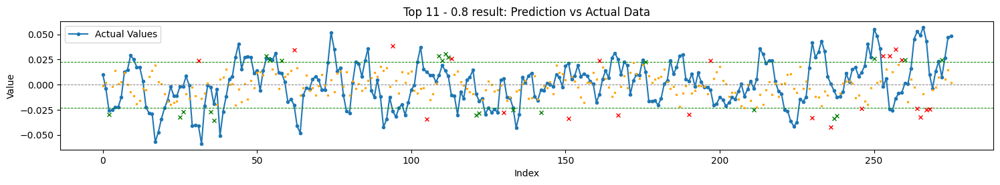

Total TH Pred.: 45
TH Pred. acc. : 51.11


Top 12 - 0.8
RMSE: 0.030295, STD_DEV: 0.021968, STD_PRD: 0.017987, OBJDIFF: 0.010317, RDIFF: 0.008326
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.028495, inv. diff> 0.008517
Trend accuracy       : 47.273
Trend up accuracy    : 39.726
Trend down accuracy  : 55.814


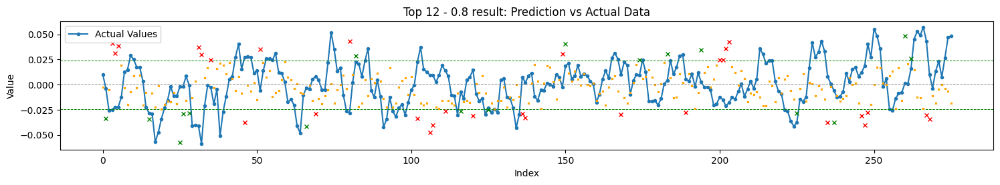

Total TH Pred.: 47
TH Pred. acc. : 36.17


Top 13 - 0.8
RMSE: 0.025215, STD_DEV: 0.021968, STD_PRD: 0.007600, OBJDIFF: 0.010431, RDIFF: 0.003247
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023599, inv. diff> 0.008815
Trend accuracy       : 44.364
Trend up accuracy    : 56.164
Trend down accuracy  : 31.008


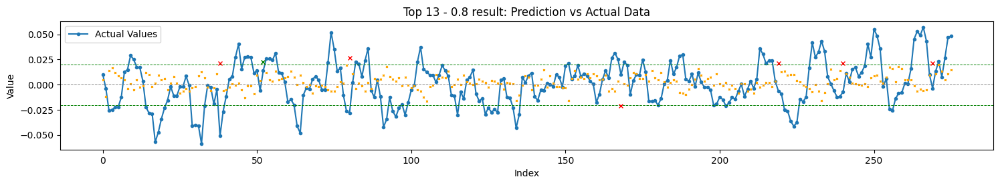

Total TH Pred.: 7
TH Pred. acc. : 14.29


Top 14 - 0.8
RMSE: 0.029828, STD_DEV: 0.022002, STD_PRD: 0.015809, OBJDIFF: 0.010923, RDIFF: 0.007827
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027100, inv. diff> 0.008195
Trend accuracy       : 43.796
Trend up accuracy    : 40.000
Trend down accuracy  : 48.062


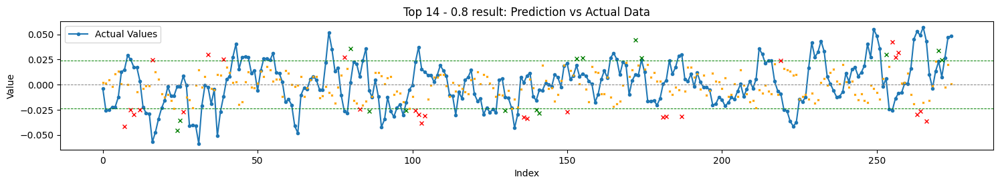

Total TH Pred.: 42
TH Pred. acc. : 35.71


Top 15 - 0.8
RMSE: 0.031365, STD_DEV: 0.021968, STD_PRD: 0.018386, OBJDIFF: 0.011188, RDIFF: 0.009397
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.028790, inv. diff> 0.008613
Trend accuracy       : 44.364
Trend up accuracy    : 37.671
Trend down accuracy  : 51.938


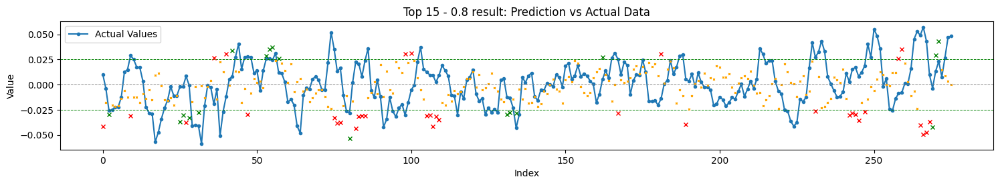

Total TH Pred.: 53
TH Pred. acc. : 33.96


Top 1 - 0.9
RMSE: 0.025250, STD_DEV: 0.021968, STD_PRD: 0.014859, OBJDIFF: 0.006836, RDIFF: 0.003281
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.026543, inv. diff> 0.008129
Trend accuracy       : 52.364
Trend up accuracy    : 47.945
Trend down accuracy  : 57.364


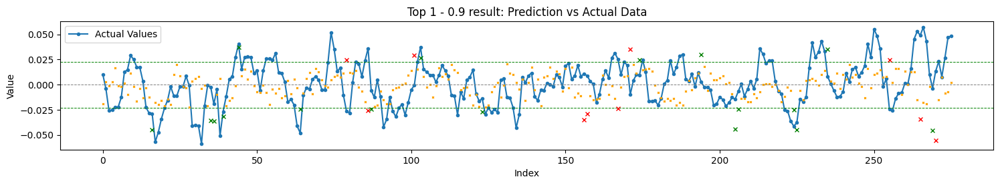

Total TH Pred.: 27
TH Pred. acc. : 62.96


Top 2 - 0.9
RMSE: 0.027104, STD_DEV: 0.021968, STD_PRD: 0.015857, OBJDIFF: 0.008191, RDIFF: 0.005135
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027177, inv. diff> 0.008264
Trend accuracy       : 50.182
Trend up accuracy    : 54.110
Trend down accuracy  : 45.736


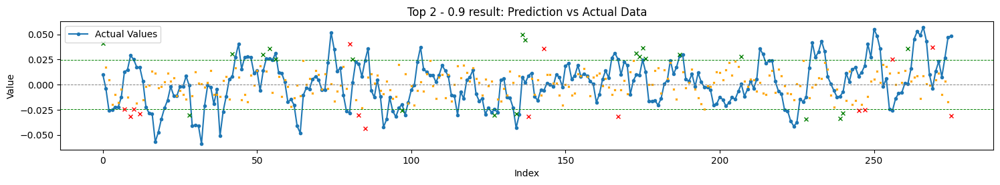

Total TH Pred.: 37
TH Pred. acc. : 59.46


Top 3 - 0.9
RMSE: 0.026751, STD_DEV: 0.022002, STD_PRD: 0.013419, OBJDIFF: 0.009040, RDIFF: 0.004749
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.025771, inv. diff> 0.008061
Trend accuracy       : 49.635
Trend up accuracy    : 41.379
Trend down accuracy  : 58.915


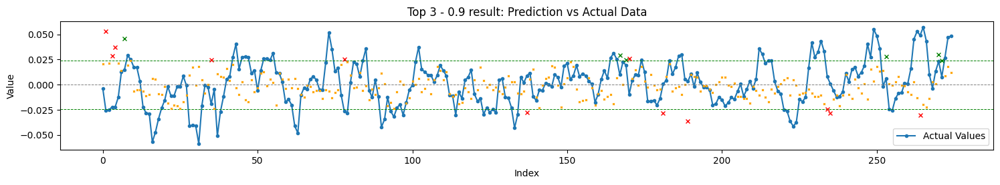

Total TH Pred.: 18
TH Pred. acc. : 33.33


Top 4 - 0.9
RMSE: 0.028593, STD_DEV: 0.022002, STD_PRD: 0.016926, OBJDIFF: 0.009130, RDIFF: 0.006592
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027780, inv. diff> 0.008316
Trend accuracy       : 47.080
Trend up accuracy    : 42.759
Trend down accuracy  : 51.938


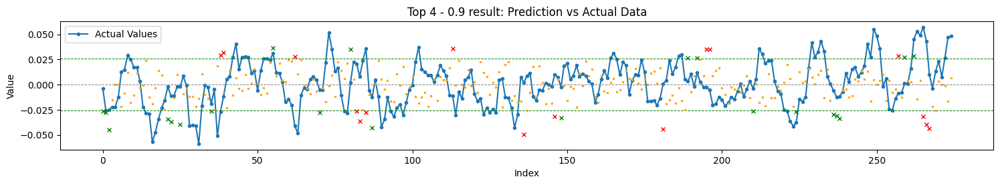

Total TH Pred.: 37
TH Pred. acc. : 56.76


Top 5 - 0.9
RMSE: 0.024741, STD_DEV: 0.021968, STD_PRD: 0.009200, OBJDIFF: 0.009156, RDIFF: 0.002772
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023818, inv. diff> 0.008234
Trend accuracy       : 48.727
Trend up accuracy    : 43.836
Trend down accuracy  : 54.264


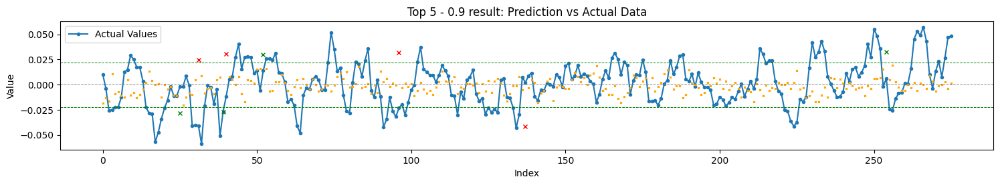

Total TH Pred.: 8
TH Pred. acc. : 50.00


Top 6 - 0.9
RMSE: 0.023835, STD_DEV: 0.021968, STD_PRD: 0.007019, OBJDIFF: 0.009341, RDIFF: 0.001866
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023350, inv. diff> 0.008856
Trend accuracy       : 48.727
Trend up accuracy    : 60.274
Trend down accuracy  : 35.659


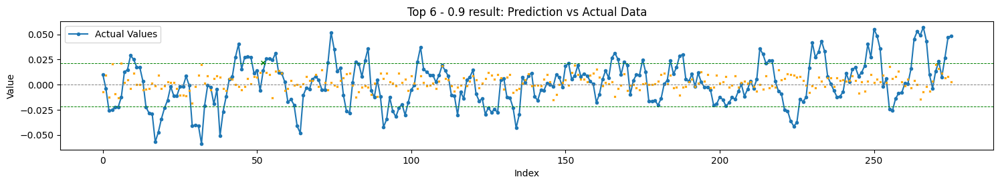

Total TH Pred.: 1
TH Pred. acc. : 100.00


Top 7 - 0.9
RMSE: 0.029913, STD_DEV: 0.022002, STD_PRD: 0.018920, OBJDIFF: 0.009453, RDIFF: 0.007912
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.029018, inv. diff> 0.008558
Trend accuracy       : 44.891
Trend up accuracy    : 43.448
Trend down accuracy  : 46.512


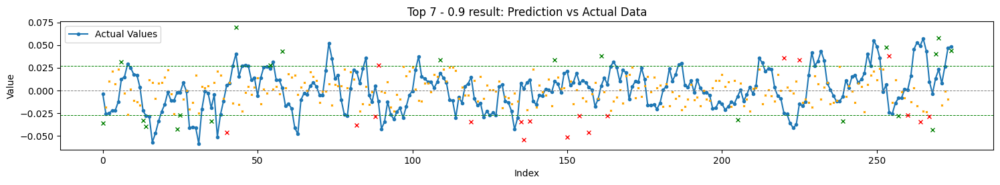

Total TH Pred.: 39
TH Pred. acc. : 53.85


Top 8 - 0.9
RMSE: 0.024096, STD_DEV: 0.022002, STD_PRD: 0.007117, OBJDIFF: 0.009537, RDIFF: 0.002095
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023173, inv. diff> 0.008614
Trend accuracy       : 47.445
Trend up accuracy    : 51.724
Trend down accuracy  : 42.636


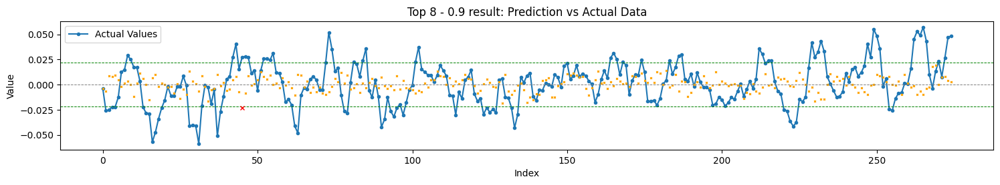

Total TH Pred.: 1
TH Pred. acc. : 0.00


Top 9 - 0.9
RMSE: 0.024771, STD_DEV: 0.022002, STD_PRD: 0.008135, OBJDIFF: 0.009703, RDIFF: 0.002770
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023517, inv. diff> 0.008449
Trend accuracy       : 43.431
Trend up accuracy    : 46.897
Trend down accuracy  : 39.535


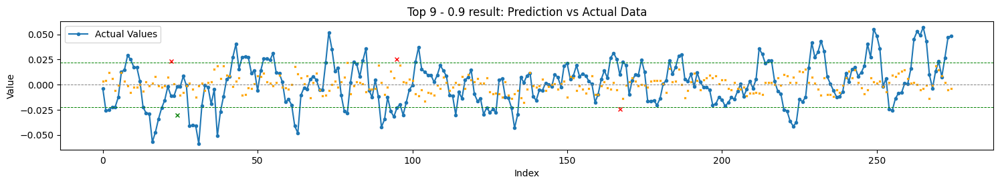

Total TH Pred.: 4
TH Pred. acc. : 25.00


Top 10 - 0.9
RMSE: 0.024533, STD_DEV: 0.022002, STD_PRD: 0.007475, OBJDIFF: 0.009795, RDIFF: 0.002531
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023295, inv. diff> 0.008556
Trend accuracy       : 45.255
Trend up accuracy    : 50.345
Trend down accuracy  : 39.535


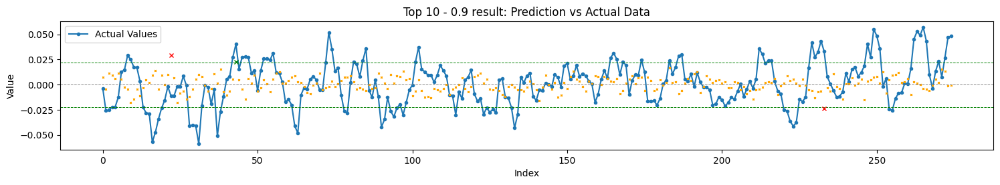

Total TH Pred.: 3
TH Pred. acc. : 33.33


Top 11 - 0.9
RMSE: 0.028523, STD_DEV: 0.021968, STD_PRD: 0.014947, OBJDIFF: 0.010065, RDIFF: 0.006555
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.026571, inv. diff> 0.008113
Trend accuracy       : 44.000
Trend up accuracy    : 41.096
Trend down accuracy  : 47.287


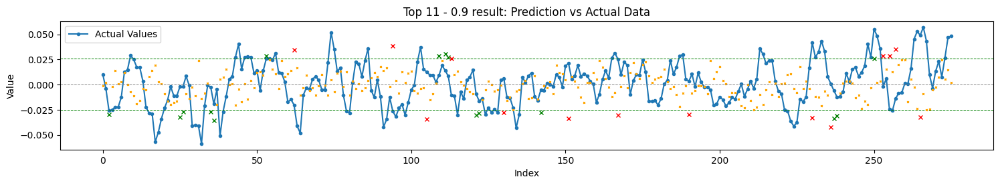

Total TH Pred.: 29
TH Pred. acc. : 51.72


Top 12 - 0.9
RMSE: 0.030295, STD_DEV: 0.021968, STD_PRD: 0.017987, OBJDIFF: 0.010317, RDIFF: 0.008326
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.028495, inv. diff> 0.008517
Trend accuracy       : 47.273
Trend up accuracy    : 39.726
Trend down accuracy  : 55.814


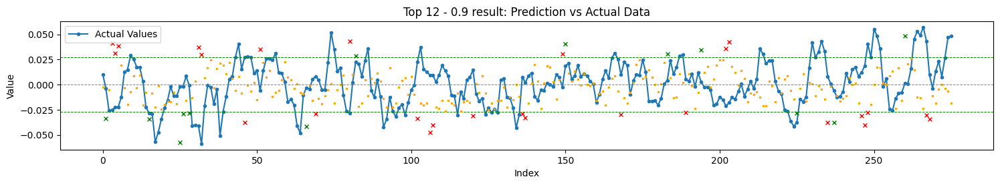

Total TH Pred.: 39
TH Pred. acc. : 33.33


Top 13 - 0.9
RMSE: 0.025215, STD_DEV: 0.021968, STD_PRD: 0.007600, OBJDIFF: 0.010431, RDIFF: 0.003247
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023599, inv. diff> 0.008815
Trend accuracy       : 44.364
Trend up accuracy    : 56.164
Trend down accuracy  : 31.008


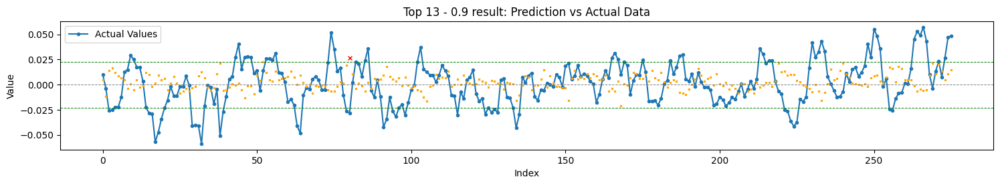

Total TH Pred.: 1
TH Pred. acc. : 0.00


Top 14 - 0.9
RMSE: 0.029828, STD_DEV: 0.022002, STD_PRD: 0.015809, OBJDIFF: 0.010923, RDIFF: 0.007827
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027100, inv. diff> 0.008195
Trend accuracy       : 43.796
Trend up accuracy    : 40.000
Trend down accuracy  : 48.062


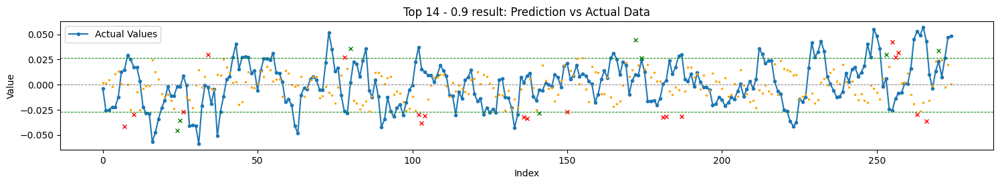

Total TH Pred.: 27
TH Pred. acc. : 29.63


Top 15 - 0.9
RMSE: 0.031365, STD_DEV: 0.021968, STD_PRD: 0.018386, OBJDIFF: 0.011188, RDIFF: 0.009397
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.028790, inv. diff> 0.008613
Trend accuracy       : 44.364
Trend up accuracy    : 37.671
Trend down accuracy  : 51.938


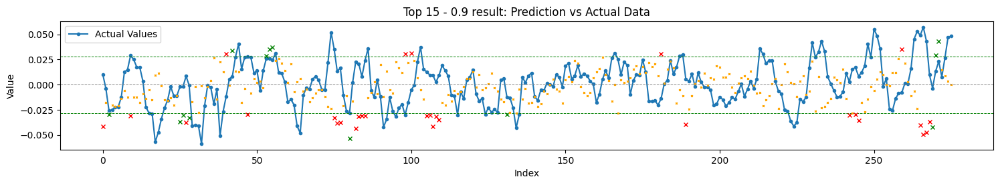

Total TH Pred.: 42
TH Pred. acc. : 30.95


Top 1 - 1.0
RMSE: 0.025250, STD_DEV: 0.021968, STD_PRD: 0.014859, OBJDIFF: 0.006836, RDIFF: 0.003281
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.026543, inv. diff> 0.008129
Trend accuracy       : 52.364
Trend up accuracy    : 47.945
Trend down accuracy  : 57.364


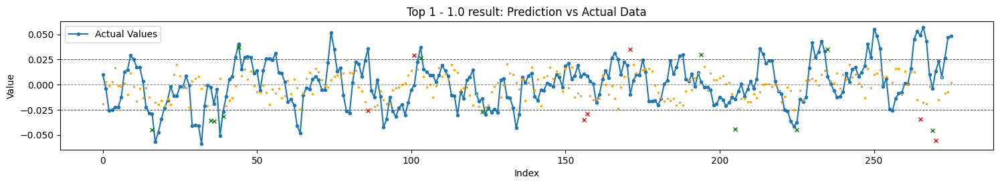

Total TH Pred.: 19
TH Pred. acc. : 63.16


Top 2 - 1.0
RMSE: 0.027104, STD_DEV: 0.021968, STD_PRD: 0.015857, OBJDIFF: 0.008191, RDIFF: 0.005135
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027177, inv. diff> 0.008264
Trend accuracy       : 50.182
Trend up accuracy    : 54.110
Trend down accuracy  : 45.736


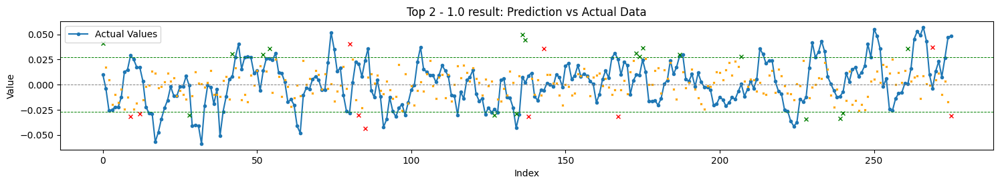

Total TH Pred.: 28
TH Pred. acc. : 64.29


Top 3 - 1.0
RMSE: 0.026751, STD_DEV: 0.022002, STD_PRD: 0.013419, OBJDIFF: 0.009040, RDIFF: 0.004749
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.025771, inv. diff> 0.008061
Trend accuracy       : 49.635
Trend up accuracy    : 41.379
Trend down accuracy  : 58.915


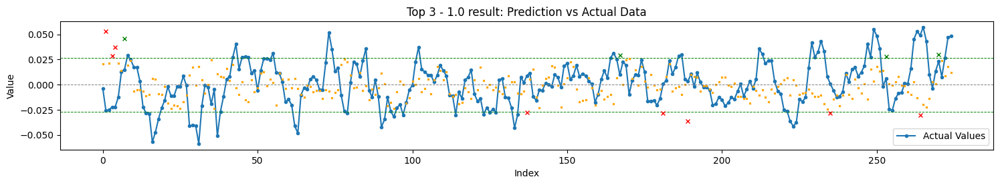

Total TH Pred.: 12
TH Pred. acc. : 33.33


Top 4 - 1.0
RMSE: 0.028593, STD_DEV: 0.022002, STD_PRD: 0.016926, OBJDIFF: 0.009130, RDIFF: 0.006592
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027780, inv. diff> 0.008316
Trend accuracy       : 47.080
Trend up accuracy    : 42.759
Trend down accuracy  : 51.938


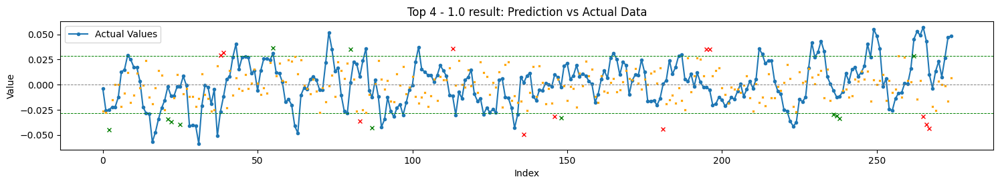

Total TH Pred.: 24
TH Pred. acc. : 50.00


Top 5 - 1.0
RMSE: 0.024741, STD_DEV: 0.021968, STD_PRD: 0.009200, OBJDIFF: 0.009156, RDIFF: 0.002772
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023818, inv. diff> 0.008234
Trend accuracy       : 48.727
Trend up accuracy    : 43.836
Trend down accuracy  : 54.264


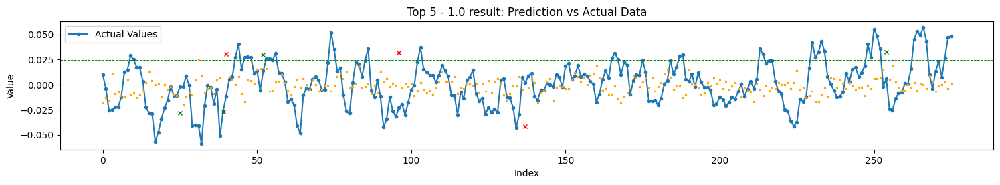

Total TH Pred.: 7
TH Pred. acc. : 57.14


Top 6 - 1.0
RMSE: 0.023835, STD_DEV: 0.021968, STD_PRD: 0.007019, OBJDIFF: 0.009341, RDIFF: 0.001866
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023350, inv. diff> 0.008856
Trend accuracy       : 48.727
Trend up accuracy    : 60.274
Trend down accuracy  : 35.659


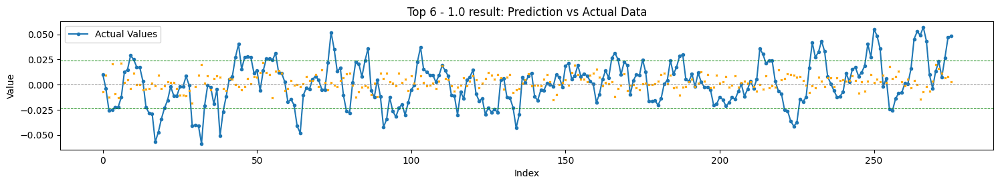

Total TH Pred.: 0


Top 7 - 1.0
RMSE: 0.029913, STD_DEV: 0.022002, STD_PRD: 0.018920, OBJDIFF: 0.009453, RDIFF: 0.007912
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.029018, inv. diff> 0.008558
Trend accuracy       : 44.891
Trend up accuracy    : 43.448
Trend down accuracy  : 46.512


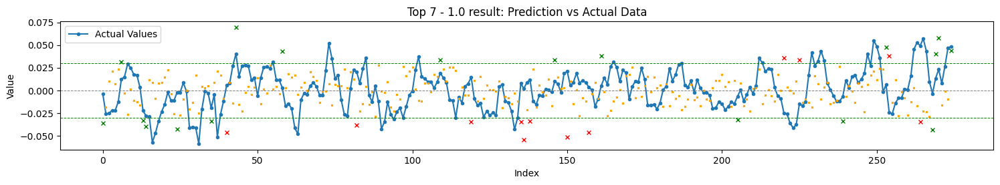

Total TH Pred.: 30
TH Pred. acc. : 60.00


Top 8 - 1.0
RMSE: 0.024096, STD_DEV: 0.022002, STD_PRD: 0.007117, OBJDIFF: 0.009537, RDIFF: 0.002095
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023173, inv. diff> 0.008614
Trend accuracy       : 47.445
Trend up accuracy    : 51.724
Trend down accuracy  : 42.636


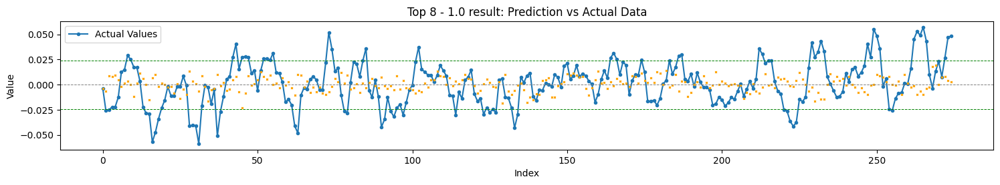

Total TH Pred.: 0


Top 9 - 1.0
RMSE: 0.024771, STD_DEV: 0.022002, STD_PRD: 0.008135, OBJDIFF: 0.009703, RDIFF: 0.002770
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023517, inv. diff> 0.008449
Trend accuracy       : 43.431
Trend up accuracy    : 46.897
Trend down accuracy  : 39.535


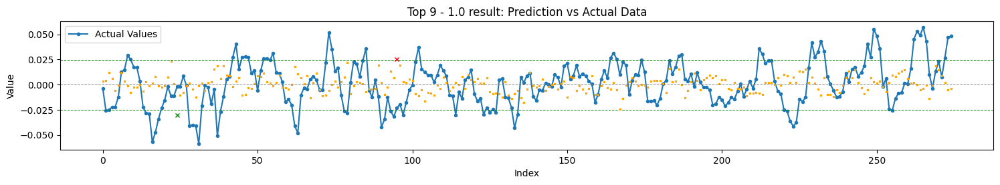

Total TH Pred.: 2
TH Pred. acc. : 50.00


Top 10 - 1.0
RMSE: 0.024533, STD_DEV: 0.022002, STD_PRD: 0.007475, OBJDIFF: 0.009795, RDIFF: 0.002531
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023295, inv. diff> 0.008556
Trend accuracy       : 45.255
Trend up accuracy    : 50.345
Trend down accuracy  : 39.535


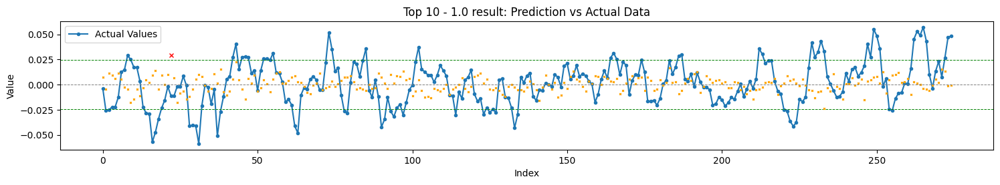

Total TH Pred.: 1
TH Pred. acc. : 0.00


Top 11 - 1.0
RMSE: 0.028523, STD_DEV: 0.021968, STD_PRD: 0.014947, OBJDIFF: 0.010065, RDIFF: 0.006555
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.026571, inv. diff> 0.008113
Trend accuracy       : 44.000
Trend up accuracy    : 41.096
Trend down accuracy  : 47.287


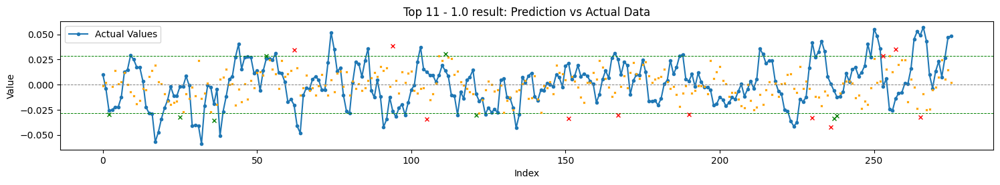

Total TH Pred.: 19
TH Pred. acc. : 42.11


Top 12 - 1.0
RMSE: 0.030295, STD_DEV: 0.021968, STD_PRD: 0.017987, OBJDIFF: 0.010317, RDIFF: 0.008326
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.028495, inv. diff> 0.008517
Trend accuracy       : 47.273
Trend up accuracy    : 39.726
Trend down accuracy  : 55.814


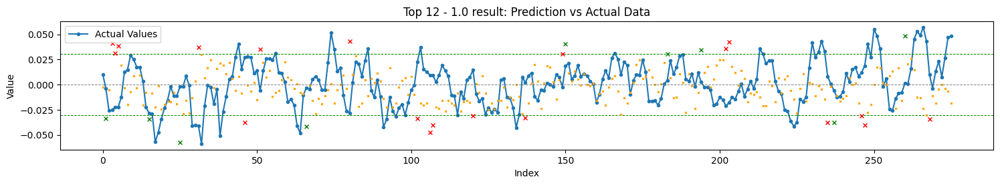

Total TH Pred.: 28
TH Pred. acc. : 32.14


Top 13 - 1.0
RMSE: 0.025215, STD_DEV: 0.021968, STD_PRD: 0.007600, OBJDIFF: 0.010431, RDIFF: 0.003247
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023599, inv. diff> 0.008815
Trend accuracy       : 44.364
Trend up accuracy    : 56.164
Trend down accuracy  : 31.008


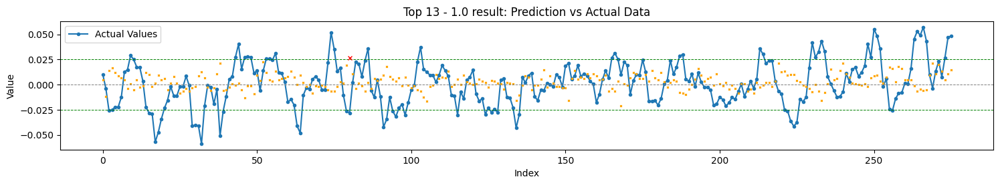

Total TH Pred.: 1
TH Pred. acc. : 0.00


Top 14 - 1.0
RMSE: 0.029828, STD_DEV: 0.022002, STD_PRD: 0.015809, OBJDIFF: 0.010923, RDIFF: 0.007827
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027100, inv. diff> 0.008195
Trend accuracy       : 43.796
Trend up accuracy    : 40.000
Trend down accuracy  : 48.062


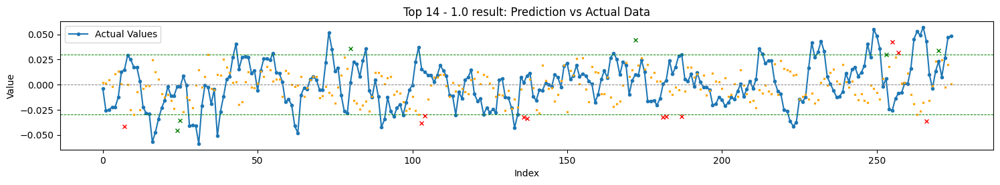

Total TH Pred.: 17
TH Pred. acc. : 35.29


Top 15 - 1.0
RMSE: 0.031365, STD_DEV: 0.021968, STD_PRD: 0.018386, OBJDIFF: 0.011188, RDIFF: 0.009397
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x704e52f0e890>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.028790, inv. diff> 0.008613
Trend accuracy       : 44.364
Trend up accuracy    : 37.671
Trend down accuracy  : 51.938


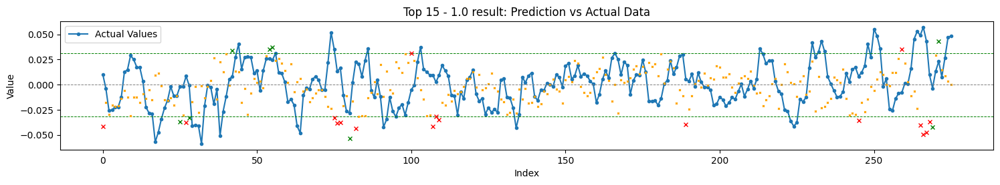

Total TH Pred.: 25
TH Pred. acc. : 32.00




In [17]:
for mult in [.5,.6,.7,.8,.9,1.0]:
    for i,result in enumerate(top_results_sort,1):

        # if result['rmse']-result['std_dev'] >= 0:
        #     continue

        print(f"Top {i} - {mult}")

        # if (result['rmse']<result['std_dev']):
        #     result['diff'] = result['rmse']-result['std_dev'] + abs(np.std(result['predictions']) - result['std_dev'])/4.0
        # else:
        #     result['diff'] = (result['rmse']- result['std_dev']) + abs(np.std(result['predictions']) - result['std_dev'])/2.0

        print("RMSE: {:.6f}, STD_DEV: {:.6f}, STD_PRD: {:.6f}, OBJDIFF: {:.6f}, RDIFF: {:.6f}".format(result['rmse'], result['std_dev'], np.std(result['predictions']), result['diff'],result['rmse']-result['std_dev']))
        print("n_steps: {}, batch_size: {}, epochs: {}".format(result['n_steps'], result['batch_size'], result['epochs']))
        # print("batch_size: {}, epochs: {}".format(result['batch_size'], result['epochs']))
        print("Model params: ", result['md_prm'])
        print("Feature list: ", result['feature_list'])

        # var_tot     = set(variable_options)
        # fea_list    = set(result['feature_list'])
        # print("Discarded var: {}".format(var_tot - fea_list))

        result['inv_rmse'] = inv_rmse = rmse(result['true_values'], result['predictions']*-1)
        inv_diff = (inv_rmse - result['std_dev']) + abs(np.std(result['predictions']) - result['std_dev'])/2.0
        print("Inv. rmse> {:.6f}, inv. diff> {:.6f}".format(inv_rmse, inv_diff))

        # calculate trend prediction percentage

        trend_up_true   = 0
        trend_down_true = 0
        trend_up_pred   = 0
        trend_down_pred = 0

        for j in range(len(result['true_values'])-1):
            if result['true_values'][j] > 0.0:
                trend_up_pred += 1
                if result['predictions'][j] > 0.0:
                    trend_up_true += 1
            if result['true_values'][j] < 0.0:
                trend_down_pred += 1
                if result['predictions'][j] < 0.0:
                    trend_down_true += 1

        trend_true      = trend_up_true + trend_down_true
        trend_pred      = trend_up_pred + trend_down_pred
        trend_accuracy  = trend_true/trend_pred
        print("Trend accuracy       : {:.3f}".format(trend_accuracy*100))
        print("Trend up accuracy    : {:.3f}".format(trend_up_true*100/trend_up_pred))
        print("Trend down accuracy  : {:.3f}".format(trend_down_true*100/trend_down_pred))


        tot_pred, prof, loss = plot_predictions(result['true_values'], result['predictions'],-1, title=f"Top {i} - {mult} result: Prediction vs Actual Data",rmse=result['rmse']*mult)
        print("Total TH Pred.: {}".format(tot_pred))
        if tot_pred != 0:
            print("TH Pred. acc. : {:.2f}".format(prof*100.0/tot_pred))
        print('\n')


In [18]:
# export the best result predictions and true values to a csv file
res = 1
best_result = top_results[res]
best_result_df = pd.DataFrame({'True Values': best_result['true_values'], 'Predictions': best_result['predictions'].flatten()})
best_result_df.to_csv('../output/lstm_best_result_{}.csv'.format(res), index=False)